# Test uniformity of Thorlabs 300 grating with Halpha filter scanning
==================================================================================================

- author : Jérémy Neveu
- date   : June 9th 2017


In [4]:
%%javascript
var kernel = IPython.notebook.kernel;
var thename = window.document.getElementById("notebook_name").innerHTML;
var command = "theNotebook = " + "'"+thename+"'";
kernel.execute(command);

<IPython.core.display.Javascript object>

In [5]:
%matplotlib inline
%load_ext autoreload
%autoreload 2

print theNotebook
from IPython.display import Image, display
import sys
sys.path.append("../../common_tools/")
from common_notebook import *

init_notebook()

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
ScanThor300_Halpha
ccdproc version 1.3.0.post1
bottleneck version 1.2.1
/Users/jneveu/Documents/LSST/Calibration/CTIOAnaJun2017/ana_09jun17/ScanThor300_Halpha


### Input directory

In [6]:
inputdir="../OverScanRemove/trim_images"
#inputdir="../../data/CTIODataJune2017_reducedRed/data_09jun17/"
MIN_IMGNUMBER=183
MAX_IMGNUMBER=207
date = "20170609"
tag = "trim"
holo_name = "Thor300"
object_name='HD111980'
SelectTagRe='^%s_%s_([0-9]+).fits$' % (tag,date) # regular expression to select the file
SearchTagRe='^%s_%s_[0-9]+.fits$' % (tag,date)
NBIMGPERROW=2

### Output directories

In [7]:
dir_top_images="images_notebooks/"+theNotebook ### Top directory to save images
ensure_dir(dir_top_images) # create that directory

outputdir="./cut_fitsimages"
ensure_dir(outputdir)

## Location of the spectra
----------------------------------

In [9]:
dirlist_all = [inputdir]
sorted_numbers,sorted_files = MakeFileList(dirlist_all,MIN_IMGNUMBER,MAX_IMGNUMBER,SelectTagRe,SearchTagRe) 

all_dates,all_airmass,all_images,all_titles,all_header,all_expo,all_filt,all_filt1,all_filt2=BuildImages(sorted_files,sorted_numbers,object_name)

print 'Number of images:',len(all_images)

Number of images: 25


### Show images

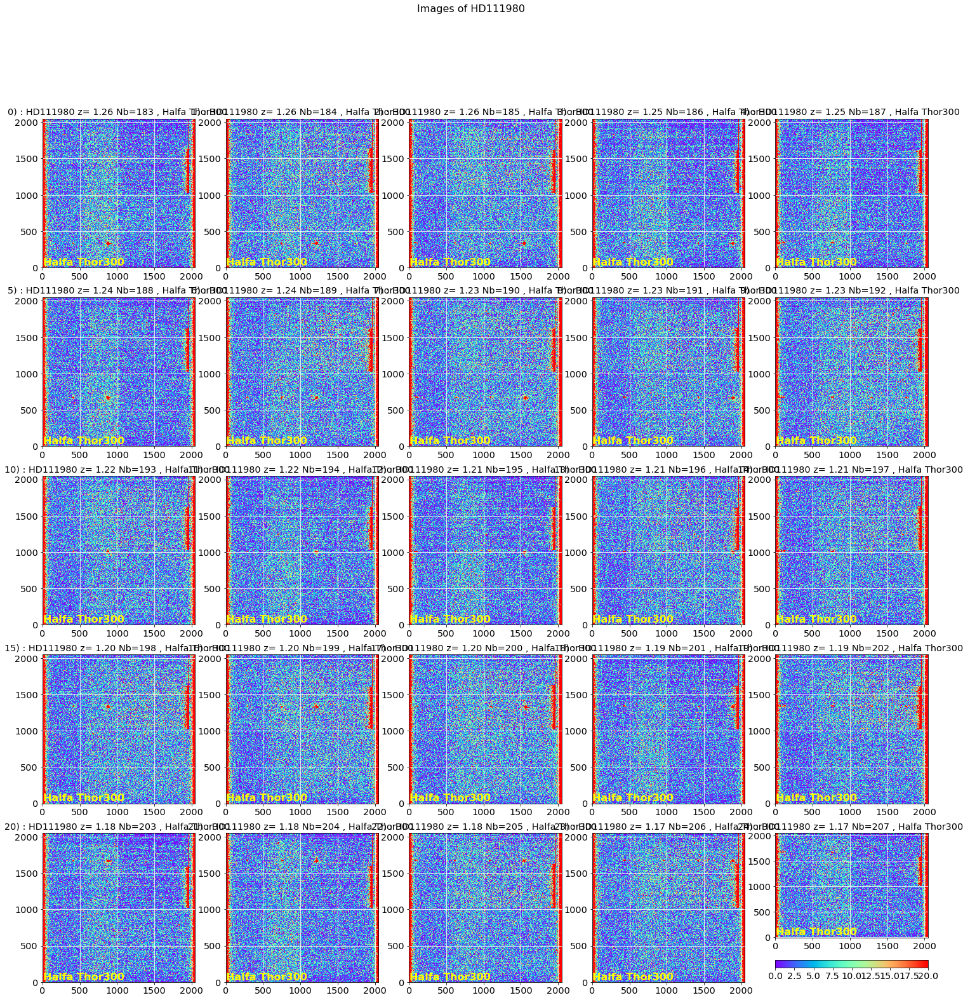

In [10]:
ShowImages(all_images,all_titles,all_filt,object_name,NBIMGPERROW=5,vmin=0,vmax=20,downsampling=1,verbose=False)

figfilename=os.path.join(dir_top_images,'input_images.pdf')
plt.savefig(figfilename)   

### Show histograms

/Users/jneveu/anaconda2/lib/python2.7/site-packages/matplotlib/axes/_base.py:3245: UserWarning: Attempted to set non-positive ylimits for log-scale axis; invalid limits will be ignored.
  'Attempted to set non-positive ylimits for log-scale axis; '


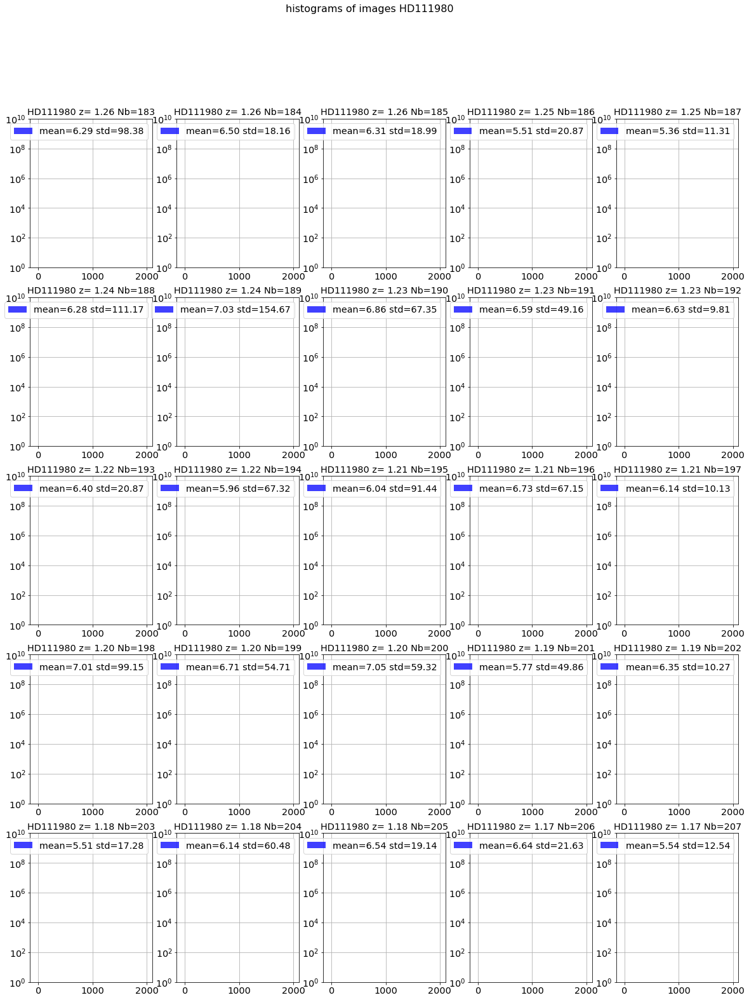

In [11]:
ShowHistograms(all_images,all_titles,all_filt,object_name,
               NBIMGPERROW=5,bins=100,range=(-50,2000),downsampling=10,verbose=False)

### Cut the images

To extract the spectra to analyze

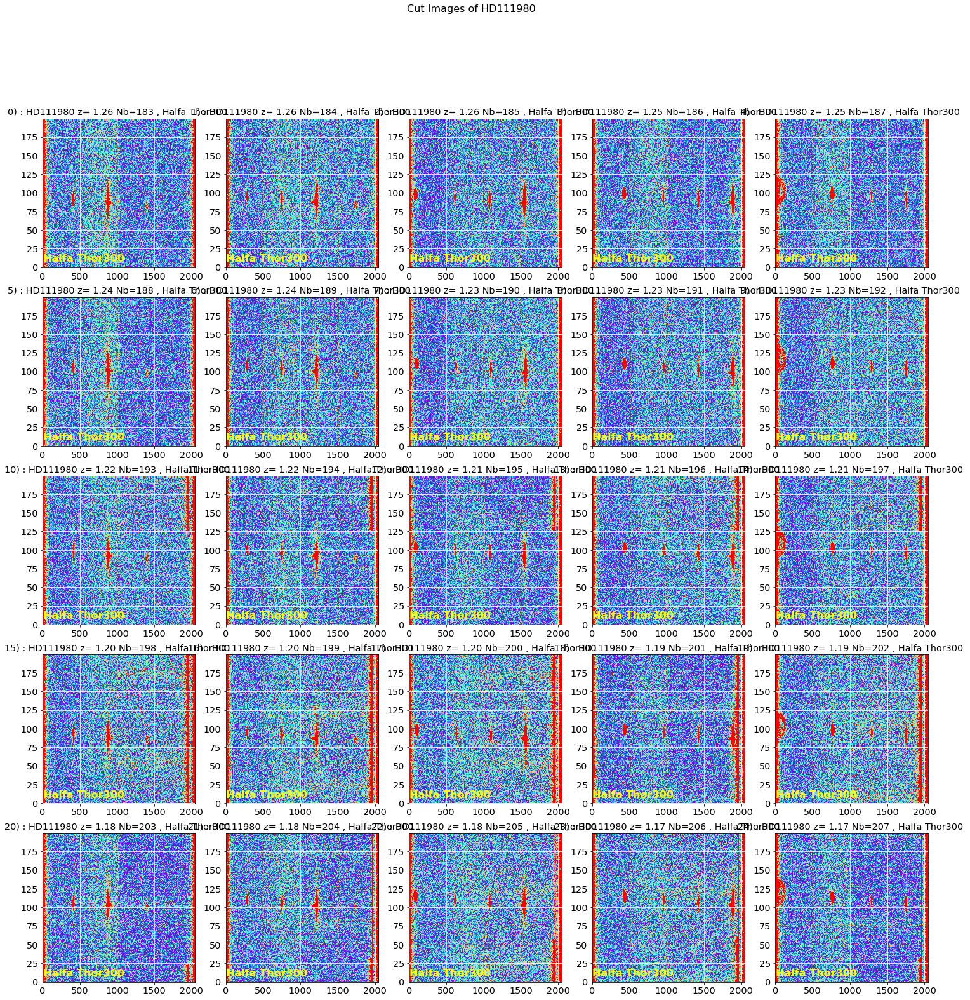

In [12]:
x_guess = [398,  740, 1076, 1403, 1741]*5
y_guess = [[340]*5, [660]*5, [1000]*5, [1340]*5, [1660]*5]
y_guess = [val for sublist in y_guess for val in sublist]
DeltaY=[100]*len(all_images)
DeltaX=[2000]*len(all_images)  # must be very large to be able to compute incident angle

images_raw=ShowCenterImages(x_guess,y_guess,DeltaX,DeltaY,all_images,all_titles,all_filt,object_name,NBIMGPERROW=5,vmin=0,vmax=20)
figfilename=os.path.join(dir_top_images,'cut_images.pdf')
plt.savefig(figfilename)   

### Save cut images

In [13]:
newfullfilenames=[]
for idx,f in np.ndenumerate(sorted_files):
    short_infilename=f.split("/")[-1]
    print short_infilename
    short_partfilename=re.findall('^%s_(.*)' % tag,short_infilename)
    short_outfilename='cutimg_'+short_partfilename[0]
    newfullfilename=os.path.join(outputdir,short_outfilename)
    newfullfilenames.append(newfullfilename)
    
for idx,f in np.ndenumerate(newfullfilenames):
    prihdu = fits.PrimaryHDU(header=all_header[idx[0]],data=images_raw[idx[0]])
    thdulist = fits.HDUList(prihdu)
    thdulist.writeto(f,overwrite=True)

trim_20170609_183.fits
trim_20170609_184.fits
trim_20170609_185.fits
trim_20170609_186.fits
trim_20170609_187.fits
trim_20170609_188.fits
trim_20170609_189.fits
trim_20170609_190.fits
trim_20170609_191.fits
trim_20170609_192.fits
trim_20170609_193.fits
trim_20170609_194.fits
trim_20170609_195.fits
trim_20170609_196.fits
trim_20170609_197.fits
trim_20170609_198.fits
trim_20170609_199.fits
trim_20170609_200.fits
trim_20170609_201.fits
trim_20170609_202.fits
trim_20170609_203.fits
trim_20170609_204.fits
trim_20170609_205.fits
trim_20170609_206.fits
trim_20170609_207.fits


In [14]:
!ls -l cut_fitsimages/*

-rw-r--r--  1 jneveu  staff  3288960  3 avr 16:43 cut_fitsimages/cutimg_20170609_183.fits
-rw-r--r--  1 jneveu  staff  3288960  3 avr 16:43 cut_fitsimages/cutimg_20170609_184.fits
-rw-r--r--  1 jneveu  staff  3288960  3 avr 16:43 cut_fitsimages/cutimg_20170609_185.fits
-rw-r--r--  1 jneveu  staff  3288960  3 avr 16:43 cut_fitsimages/cutimg_20170609_186.fits
-rw-r--r--  1 jneveu  staff  3288960  3 avr 16:43 cut_fitsimages/cutimg_20170609_187.fits
-rw-r--r--  1 jneveu  staff  3288960  3 avr 16:43 cut_fitsimages/cutimg_20170609_188.fits
-rw-r--r--  1 jneveu  staff  3288960  3 avr 16:43 cut_fitsimages/cutimg_20170609_189.fits
-rw-r--r--  1 jneveu  staff  3288960  3 avr 16:43 cut_fitsimages/cutimg_20170609_190.fits
-rw-r--r--  1 jneveu  staff  3288960  3 avr 16:43 cut_fitsimages/cutimg_20170609_191.fits
-rw-r--r--  1 jneveu  staff  3288960  3 avr 16:43 cut_fitsimages/cutimg_20170609_192.fits
-rw-r--r--  1 jneveu  staff  3288960  3 avr 16:43 cut_fitsimages/cutimg_20170609_193.fits
-rw-r--r--

# Find the optimal rotation of the spectra
============================

In [75]:
inputdir="./cut_fitsimages"
SelectTagRe='^cutimg_%s_([0-9]+).fits$' % date # regular expression to select the file
SearchTagRe='^cutimg_%s_[0-9]+.fits$' % date

outputdir="./rotated_fitsimages"
ensure_dir(outputdir)

In [76]:
sorted_numbers,sorted_files = MakeFileList([inputdir],MIN_IMGNUMBER,MAX_IMGNUMBER,SelectTagRe,SearchTagRe) 

all_dates,all_airmass,all_images,all_titles,all_header,all_expo,all_filt,all_filt1,all_filt2=BuildImages(sorted_files,sorted_numbers,object_name)

print 'Number of images:',len(all_images)

Number of images: 25


## Find rotation by Hessian analysis

La méthode s'inspire des techniques de détection de filmanents dans le milieu interstellaire.
Elle est décrite dans https://arxiv.org/pdf/1409.6728.pdf section 4.1.
Documentation sur le calcul du Hessien : http://scikit-image.org/docs/dev/api/skimage.feature.html#skimage.feature.hessian_matrix

### Test rotation optimal settings

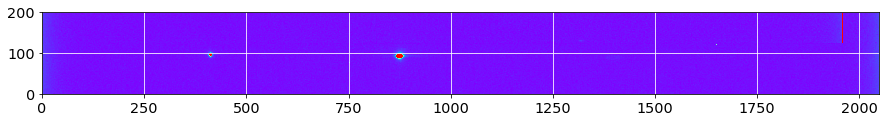

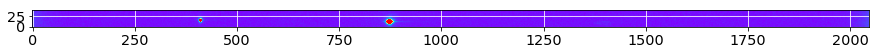

In [18]:
sel=10
image_sel=np.copy(all_images[sel])
y0=DeltaY[sel]
x0=x_guess[sel]

width_cut = 20
right_edge = IMSIZE

plt.imshow(image_sel,origin='lower',cmap='rainbow',vmin=-10,vmax=800)
plt.grid(color='white', ls='solid')
plt.show()

region=np.copy(image_sel[y0-width_cut:y0+width_cut,0:right_edge])
data=np.copy(region)
plt.imshow(data,origin='lower',cmap='rainbow',vmin=-10,vmax=800)
plt.grid(color='white', ls='solid')
plt.show()

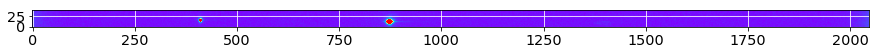

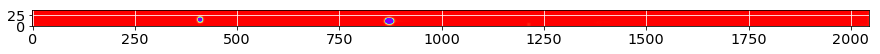

In [19]:
# le paramètre sigma permet de lisser le hessien
Hxx, Hxy, Hyy = hessian_matrix(data, sigma=3, order = 'xy')
lambda_plus = 0.5*( (Hxx+Hyy) + np.sqrt( (Hxx-Hyy)**2 +4*Hxy*Hxy) )
lambda_minus = 0.5*( (Hxx+Hyy) - np.sqrt( (Hxx-Hyy)**2 +4*Hxy*Hxy) )
theta = 0.5*np.arctan2(2*Hxy,Hyy-Hxx)*180/np.pi

margin_cut = 1

lambda_minus = lambda_minus[margin_cut:-margin_cut,margin_cut:-margin_cut]
lambda_plus = lambda_plus[margin_cut:-margin_cut,margin_cut:-margin_cut]
theta = theta[margin_cut:-margin_cut,margin_cut:-margin_cut]

plt.imshow(data,origin='lower',cmap='rainbow',vmin=-10,vmax=800)
plt.grid(color='white', ls='solid')
plt.show()
plt.imshow(lambda_minus,origin='lower',cmap='rainbow',vmin=-100,vmax=0)
plt.grid(color='white', ls='solid')
plt.show()

Number of remaining pixels : 652


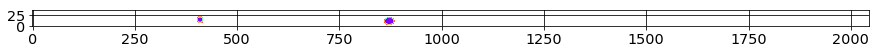

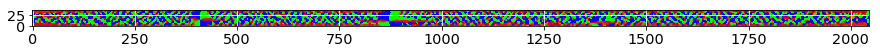

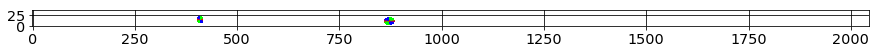

In [20]:
lambda_threshold = -10

mask = np.where(lambda_minus>lambda_threshold)
lambda_mask = np.copy(lambda_minus)
lambda_mask[mask]=np.nan

theta_mask = np.copy(theta)
theta_mask[mask]=np.nan

print 'Number of remaining pixels :',len(lambda_mask[~np.isnan(lambda_mask)])

plt.imshow(lambda_mask,origin='lower',cmap='rainbow',vmin=-100,vmax=0)
plt.grid(color='black', ls='solid')
plt.show()

plt.imshow(theta,origin='lower',cmap=cm.brg,vmin=-30,vmax=30)
plt.grid(color='white', ls='solid')
plt.show()

plt.imshow(theta_mask,origin='lower',cmap=cm.brg,vmin=-30,vmax=30)
plt.grid(color='black', ls='solid')
plt.show()

Number of remaining pixels : 151


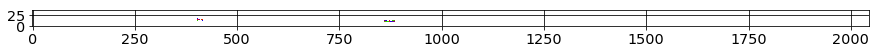

In [21]:
deg_threshold = 20

mask2 = np.where(np.abs(theta)>deg_threshold)
theta_mask[mask2] = np.nan
print 'Number of remaining pixels :',len(theta_mask[~np.isnan(theta_mask)])
plt.imshow(theta_mask,origin='lower',cmap=cm.brg,vmin=-deg_threshold,vmax=deg_threshold)
plt.grid(color='black', ls='solid')
plt.show()

Angle median : -1.18547269566


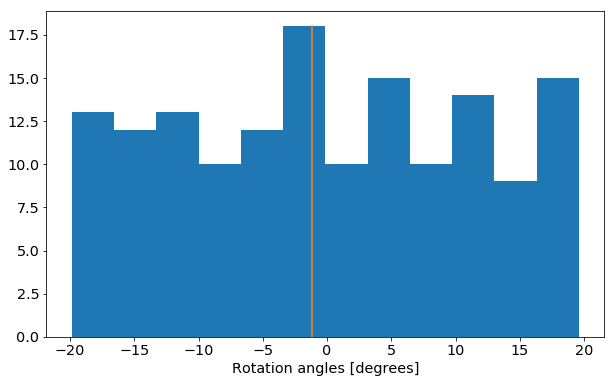

In [22]:
theta_hist = []
theta_hist = theta_mask[~np.isnan(theta_mask)].flatten()
theta_median = np.median(theta_hist)
print 'Angle median :',theta_median
fig = plt.figure(figsize=(10,6))
n,bins, patches = plt.hist(theta_hist,bins=int(np.sqrt(len(theta_hist))))
plt.plot([theta_median,theta_median],[0,np.max(n)])
plt.xlabel("Rotation angles [degrees]")
plt.show()

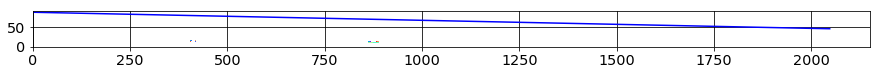

In [23]:
xindex=np.arange(data.shape[1])
x_new = np.linspace(xindex.min(),xindex.max(), 50)
y_new = y0 - width_cut + (x_new-x0)*np.tan(theta_median*np.pi/180.)
plt.imshow(theta_mask,origin='lower',cmap='rainbow',vmin=-deg_threshold,vmax=deg_threshold)
plt.plot(x_new,y_new,'b-')
plt.grid(color='black', ls='solid')
plt.show()

On peut aussi essayer de fitter le spectre qui a été détecté par la méthode ci-dessus.

Rotation angle from fit : -0.430465542825


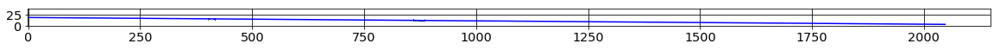

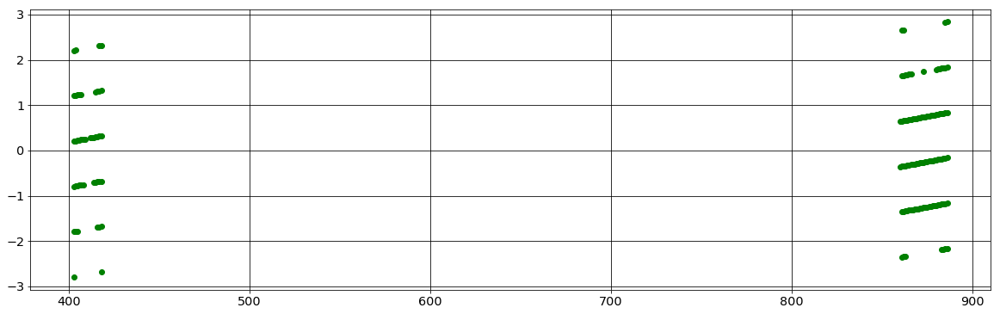

In [24]:
xtofit=[]
ytofit=[]
for iy,y in enumerate(theta_mask):
    for ix,x in enumerate(y):
        if not np.isnan(theta_mask[iy][ix]) :
            if np.abs(theta_mask[iy][ix])>deg_threshold : continue
            xtofit.append(ix)
            ytofit.append(iy)
popt, pcov = fit_line(xtofit, ytofit)
[a, b] = popt
x_new = np.linspace(xindex.min(),xindex.max(), 50)
y_new = line(x_new,a,b)
print 'Rotation angle from fit :',np.arctan(a)*180/np.pi
fig = plt.figure(figsize=[20,6])
plt.imshow(theta_mask,origin='lower',cmap=cm.brg,vmin=-deg_threshold,vmax=deg_threshold)
plt.plot(x_new,y_new,'b-')
plt.grid(color='black', ls='solid')
plt.show()
fig = plt.figure(figsize=[20,6])
diff = []
for ix,x in enumerate(xtofit):
    diff.append(ytofit[ix]-line(x,a,b))
plt.plot(xtofit,diff,'go')
plt.grid(color='black', ls='solid')
plt.show()

0  theta =  -0.441501083152
1  theta =  -0.441170908752
2  theta =  -0.440000036611
3  theta =  -0.447636635177
4  theta =  -0.420995610839
5  theta =  -0.440659425534
6  theta =  -0.43823115073
7  theta =  -0.452003243103
8  theta =  -0.439696659663
9  theta =  -0.434343134775
10  theta =  -0.430465542825
11  theta =  -0.44029931429
12  theta =  -0.451269739655
13  theta =  -0.456175936409
14  theta =  -0.473462667604
15  theta =  -0.44426130147
16  theta =  -0.452065155966
17  theta =  -0.450514192368
18  theta =  -0.45107975316
19  theta =  -0.474596179214
20  theta =  -0.423700463335
21  theta =  -0.456788860114
22  theta =  -0.43708415151
23  theta =  -0.476331393511
24  theta =  -0.522016819653


Text(0.5,0,u'angle (deg)')

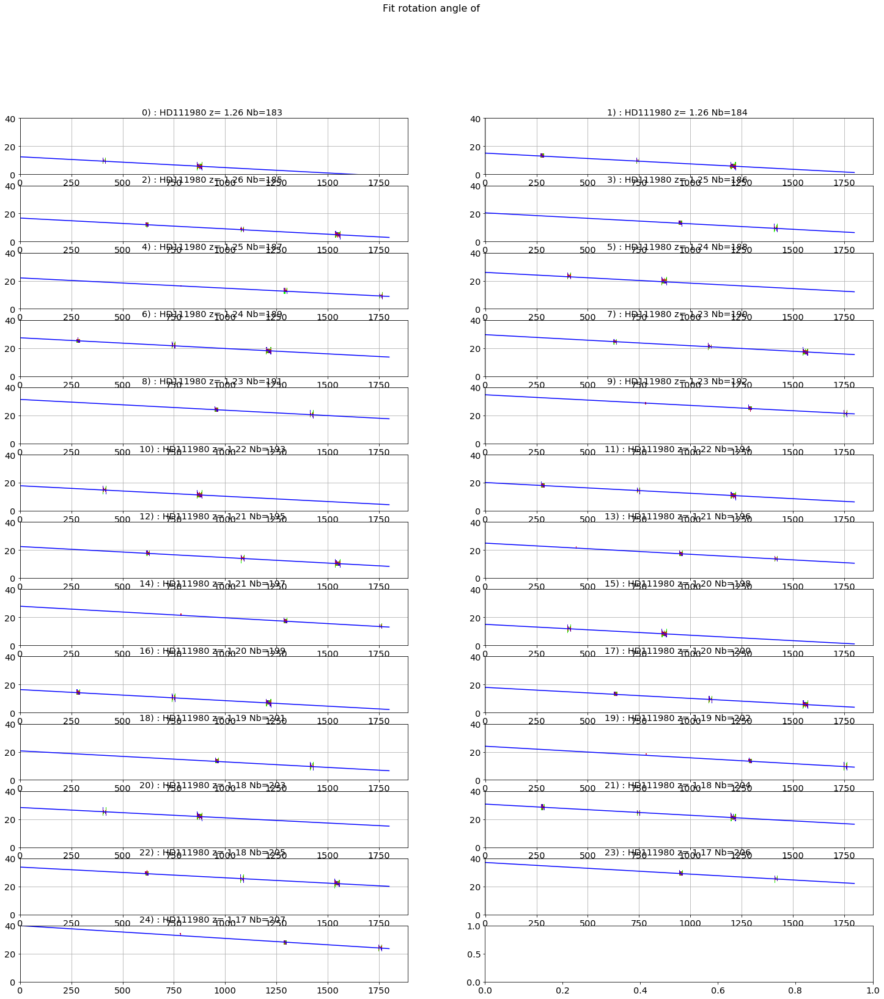

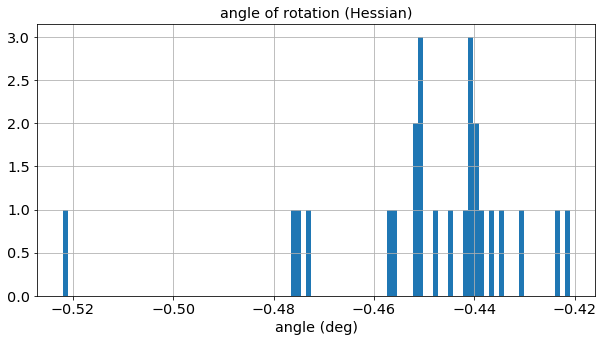

In [25]:
all_theta=ComputeRotationAngleHessianAndFit(all_images,x_guess,DeltaY,all_titles,object_name, 
   NBIMGPERROW=2, lambda_threshold = -10, deg_threshold = 20, width_cut = 20, right_edge = 1800, margin_cut=1)
figfilename=os.path.join(dir_top_images,'fit_rotation.pdf')
plt.savefig(figfilename)  

for index in range(len(all_theta)):
    print index,' theta = ',all_theta[index]
plt.figure(figsize=(10,5))
n, bins, patches=plt.hist(all_theta,bins=100,histtype='stepfilled')
plt.grid(True)
plt.title('angle of rotation (Hessian)')
plt.xlabel('angle (deg)')

### Turn the images accordingly

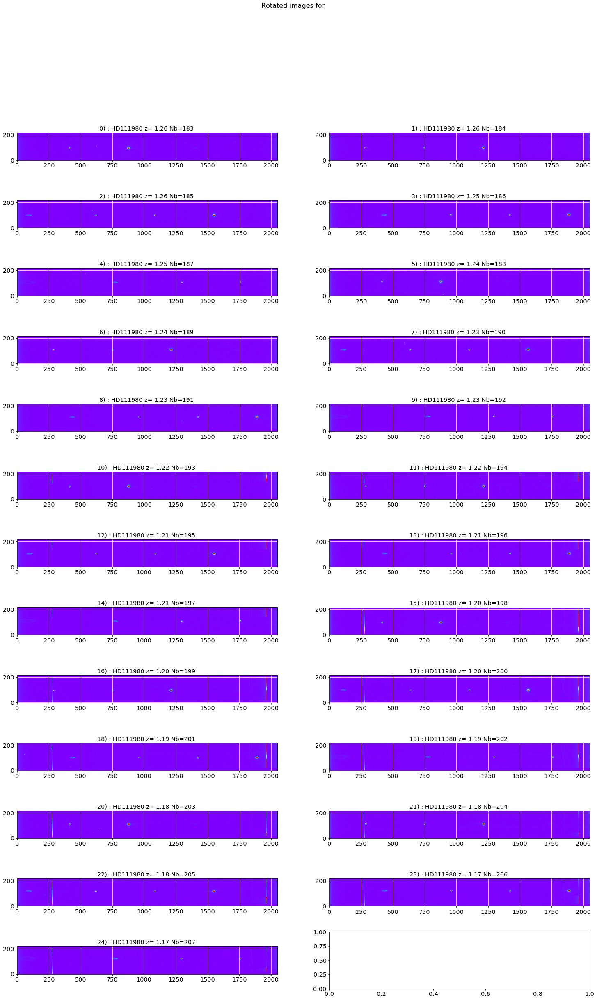

In [26]:
turned_images=TurnTheImages(all_images,all_theta,all_titles,object_name,NBIMGPERROW=2,
                            oversample_factor=1) 
figfilename=os.path.join(dir_top_images,'rotated_images.pdf')
plt.savefig(figfilename)  

### Check rotation

In case of bad rotation, check by eye

array([-0.01004226,  0.00209148, -0.00555942,  0.02089228, -0.01377113,
        0.00230581, -0.01100353,  0.0082387 ,  0.00455044,  0.00528655,
       -0.01140821,  0.00205076,  0.00278059, -0.00329164, -0.00222529,
        0.01083413, -0.00231222,  0.00774511, -0.01313734,  0.01013598,
       -0.00423566,  0.00154379, -0.0065859 , -0.0169947 ,  0.01603467])

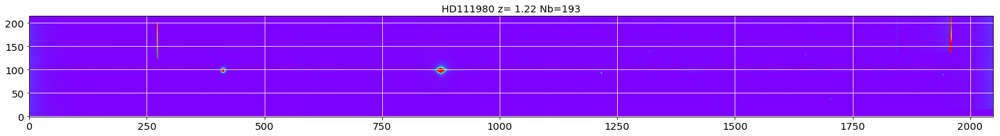

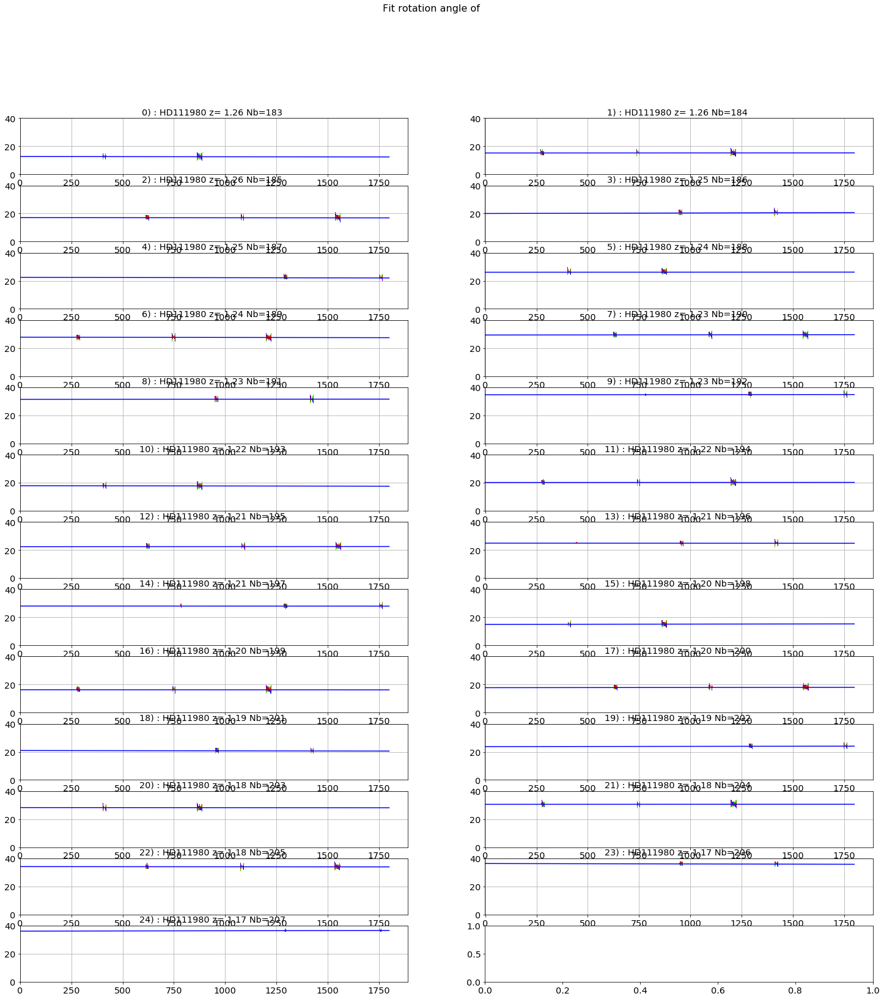

In [27]:
sel=10
plt.figure(figsize=(25,10))
plt.imshow(turned_images[sel],origin='lower',cmap='rainbow',vmin=0,vmax=1000)
plt.grid(True)
plt.title(all_titles[sel])
plt.grid(color='white', ls='solid')
figfilename=os.path.join(dir_top_images,'rotated_image_sample.pdf')
plt.savefig(figfilename)  

ComputeRotationAngleHessianAndFit(turned_images,x_guess,DeltaY,all_titles,object_name, 
            NBIMGPERROW=2, lambda_threshold = -10, deg_threshold = 20, width_cut = 20, right_edge = 1800)

Cut the extra spectra that pollute the images.

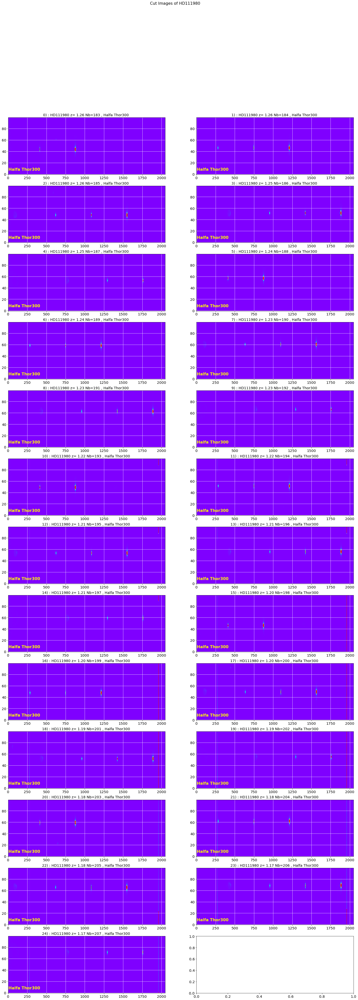

In [28]:
DeltaY_rot2 = [50]*len(all_images)
y_guess_rot2 = [100]*len(all_images)
images_cut_rot=ShowCenterImages(x_guess,y_guess_rot2,DeltaX,DeltaY_rot2,
                    turned_images,all_titles,all_filt,object_name,NBIMGPERROW=2,vmin=0,vmax=5000) 

# Find the central star locations
======================================

### Central star positions after rotation

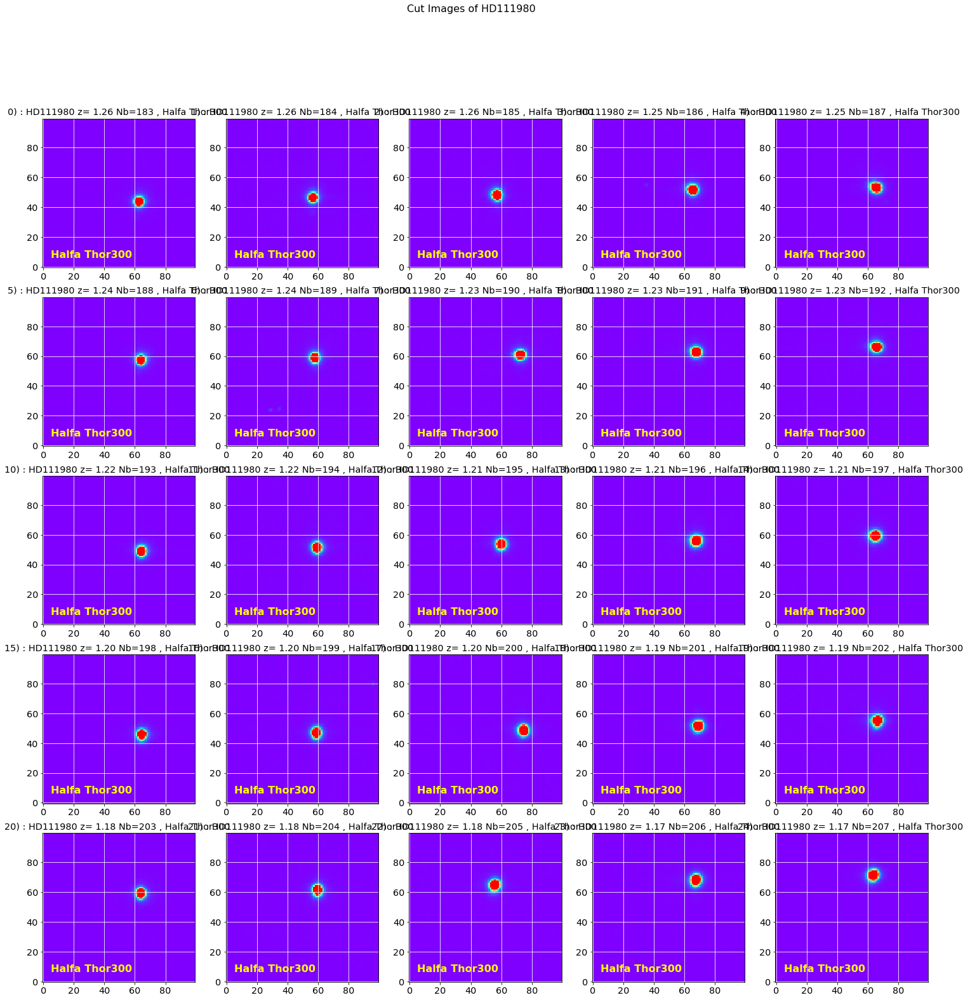

In [65]:
x_guess_rot = x_guess
y_guess_rot = DeltaY_rot2
DeltaY_rot = [50]*len(all_images)
DeltaX_rot = [50]*len(all_images)

images_cut=ShowCenterImages(x_guess_rot,y_guess_rot,DeltaX_rot,DeltaY_rot,
                    images_cut_rot,all_titles,all_filt,object_name,NBIMGPERROW=5,vmin=0,vmax=2000) 

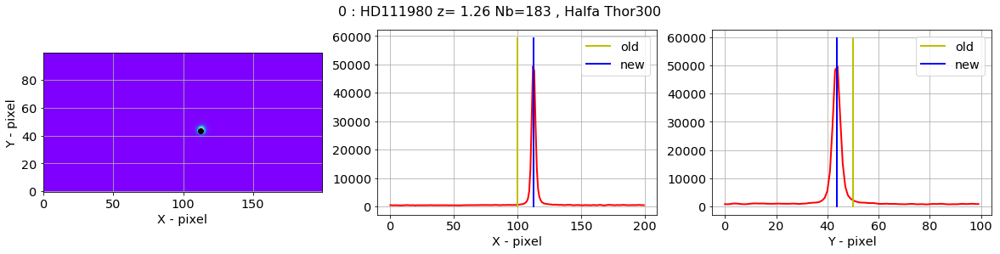

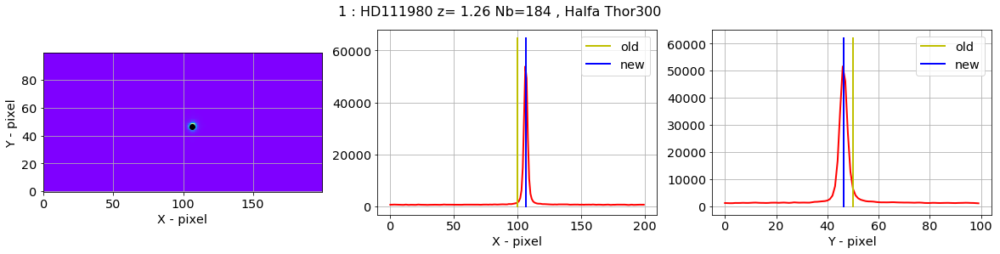

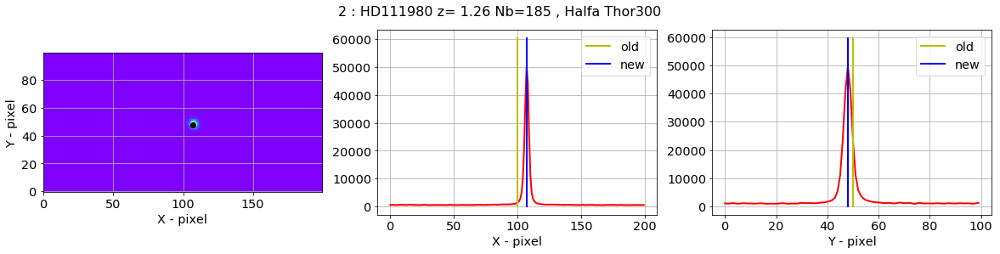

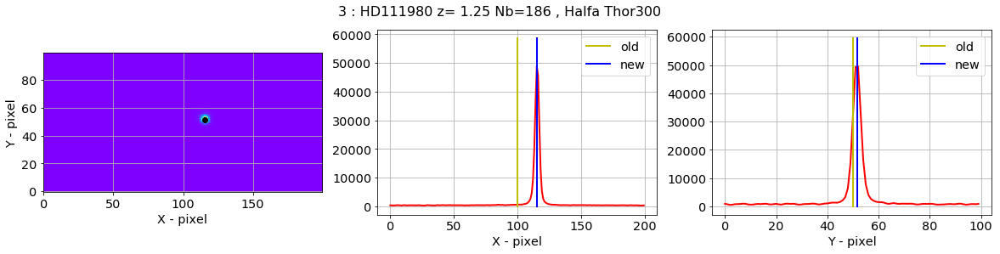

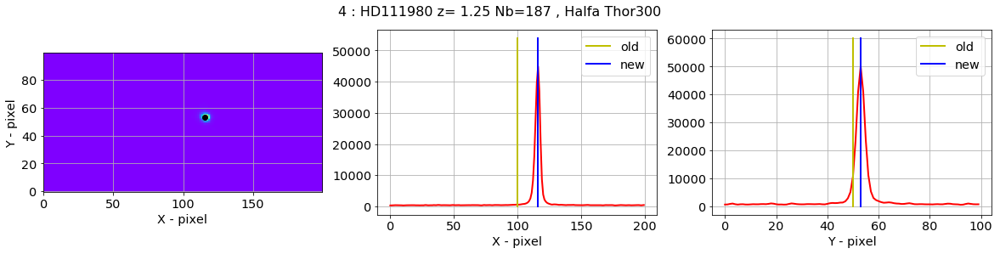

...

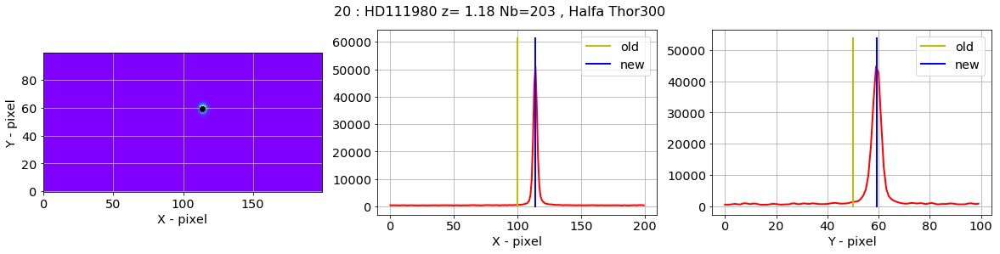

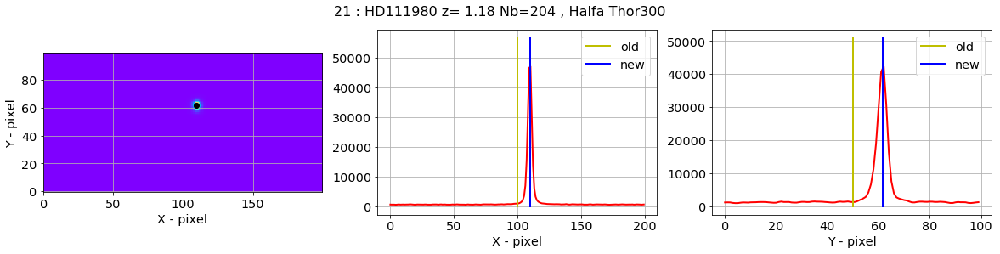

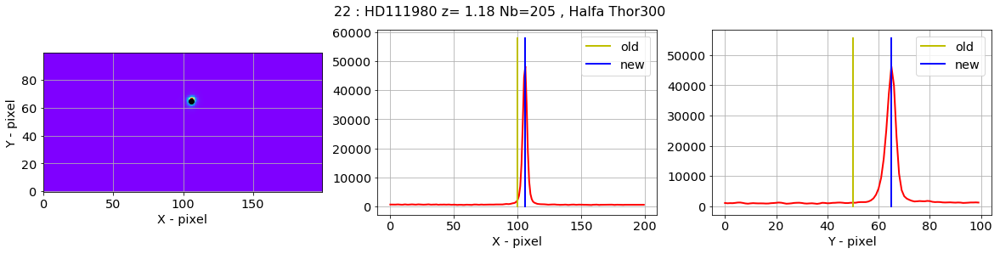

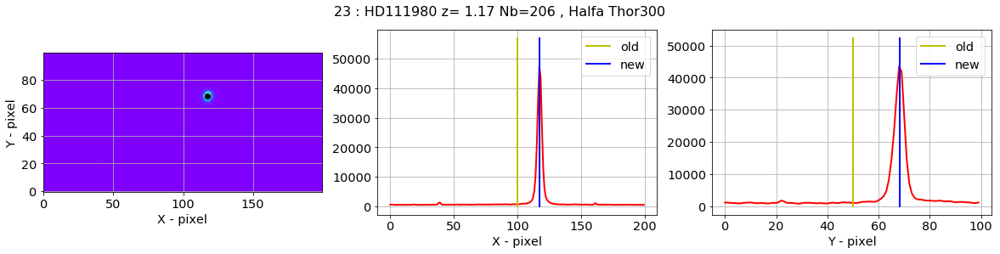

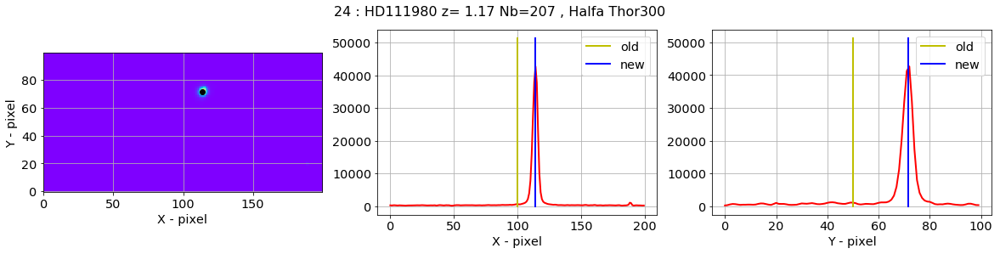

In [67]:
# (JN) valeurs optimisées pour cette étude
#img_mean,img_median,img_std,img_sources=ComputeStatImages(images_cut,fwhm=5,threshold=200,sigma=10.0,iters=5)
xstar, ystar = check_central_star(images_cut_rot,x_guess_rot,y_guess_rot,all_titles,all_filt)

### Central star position

[  410.4487099    746.33382928  1083.17725537  1418.29551305  1756.83393474
   411.85397039   747.49832463  1098.41671774  1420.53738806  1756.96624332
   412.1512976    749.02372924  1085.91637298  1420.58137533  1756.2698079
   412.35475036   748.53478245  1100.61779639  1421.84830403  1757.52530265
   411.79394449   749.49651261  1081.69298825  1420.25137497  1754.89904271] [ 43.57098824  46.28472743  48.0068736   51.51799679  53.00347918
  57.13447629  58.651262    60.58687283  62.53738582  65.93822871
  48.73577624  51.21626413  53.51580913  55.90826266  59.103558
  46.13556666  47.40385664  48.9464189   51.78504168  55.23042953
  59.31276869  61.52158047  65.02392643  68.26111895  71.50067009] [398, 740, 1076, 1403, 1741, 398, 740, 1076, 1403, 1741, 398, 740, 1076, 1403, 1741, 398, 740, 1076, 1403, 1741, 398, 740, 1076, 1403, 1741]


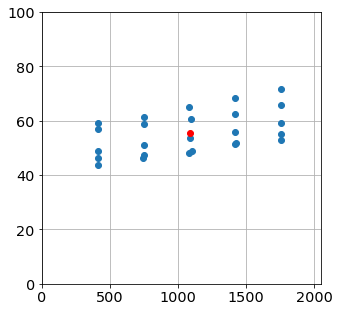

In [71]:
x_star = []
y_star = []
for index in range(len(xstar)):
    x_star.append(xstar[index])
    y_star.append(ystar[index])
        
x_mean = np.mean(x_star)
y_mean = np.mean(y_star)
img_size=all_images[0].shape
plt.figure(figsize=(5,5))
plt.plot(x_star,y_star,'o')
plt.plot(x_mean,y_mean,'ro')
plt.xlim(0,img_size[1])
plt.ylim(0,img_size[0])
plt.grid(True)

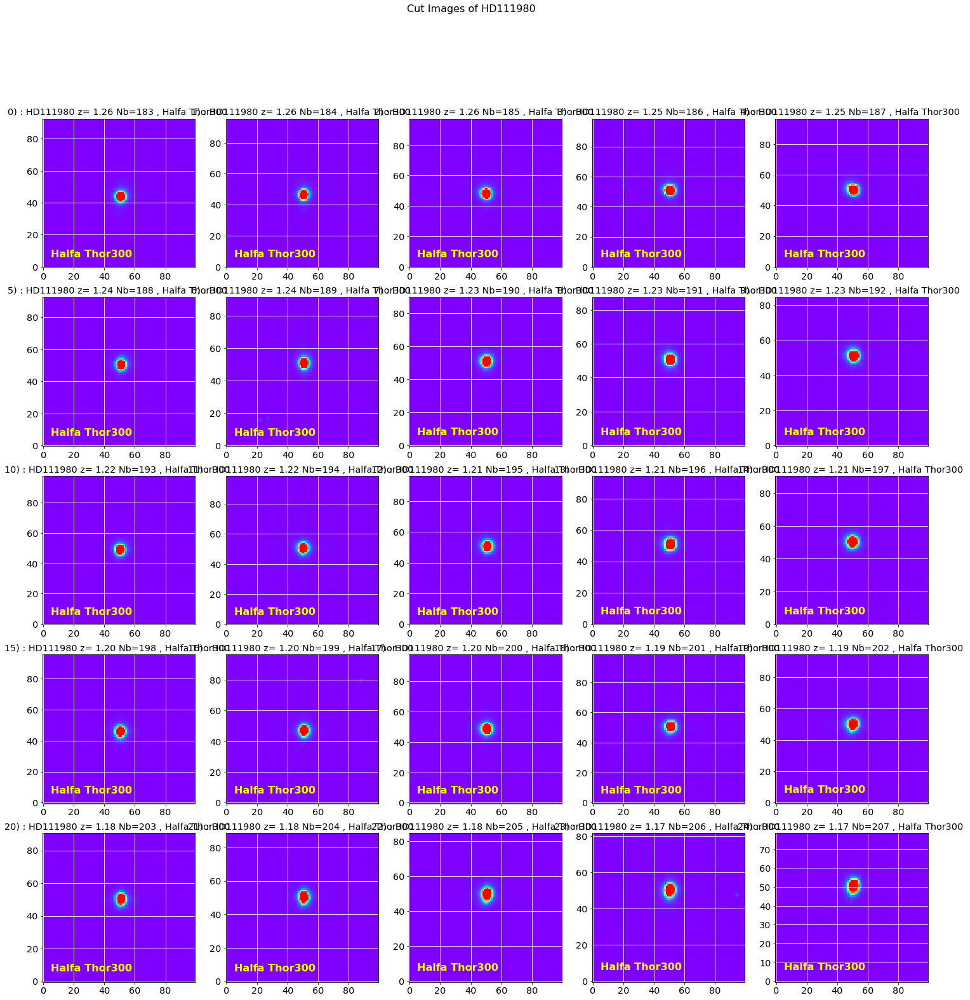

In [72]:
images_cut=ShowCenterImages(x_star,y_star,DeltaX_rot,DeltaY_rot,
                    images_cut_rot,all_titles,all_filt,object_name,NBIMGPERROW=5,vmin=0,vmax=2000) 

## Pointing positions before rotations

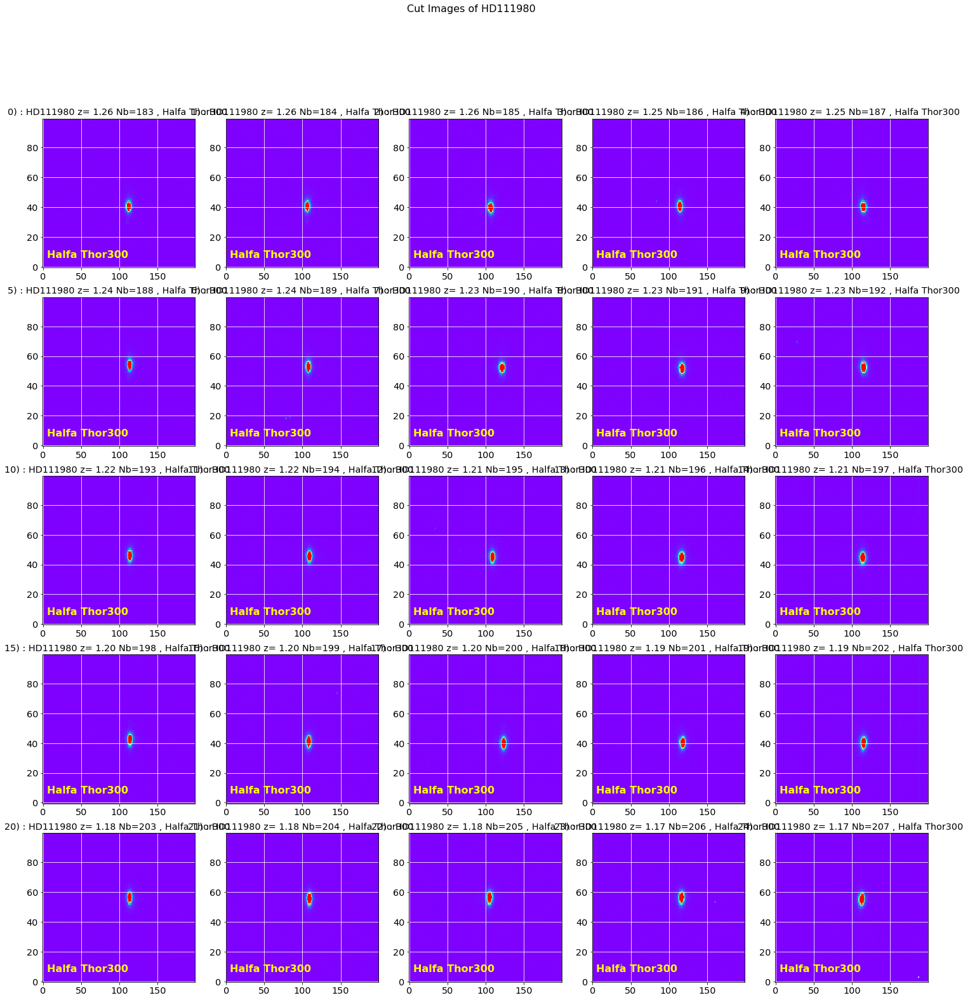

In [42]:
DeltaY_rot = [50]*len(all_images)
DeltaX_rot = [100]*len(all_images)
images_raw_cut=ShowCenterImages(x_guess,DeltaY,DeltaX_rot,DeltaY_rot,
                    images_raw,all_titles,all_filt,object_name,NBIMGPERROW=5,vmin=0,vmax=2000) 

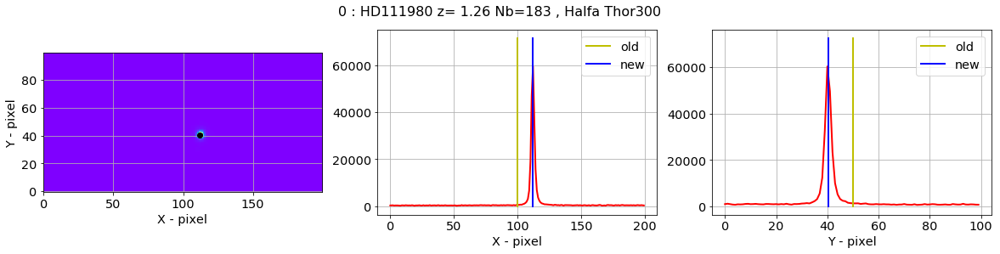

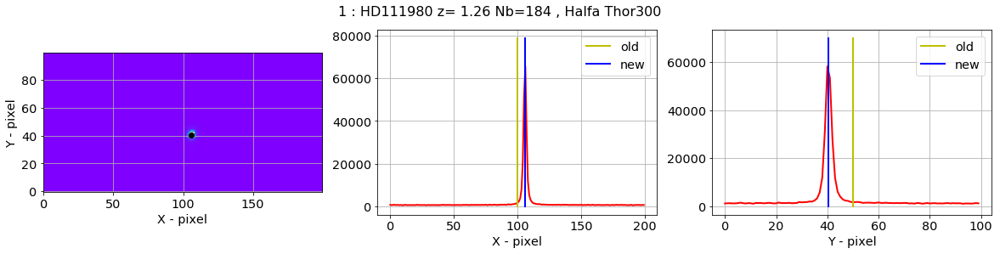

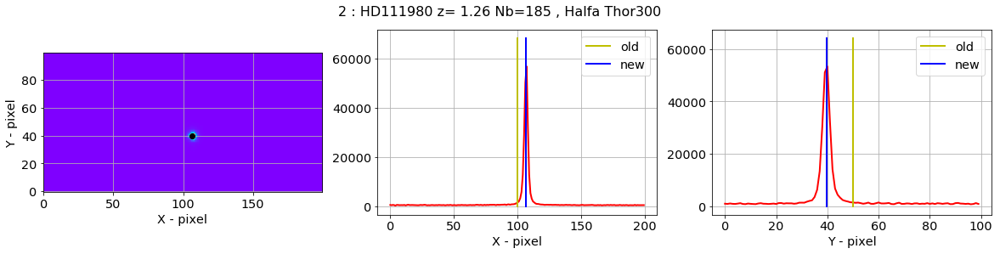

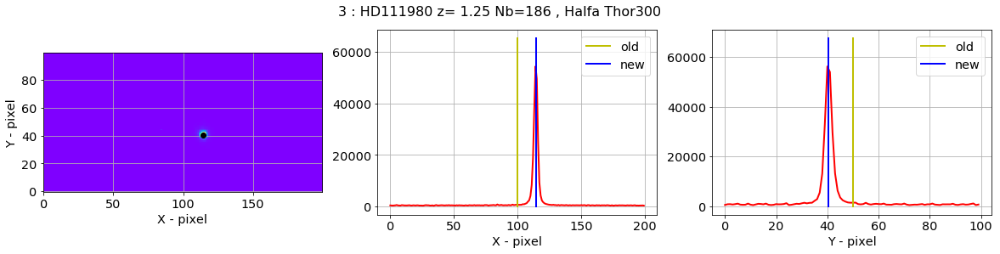

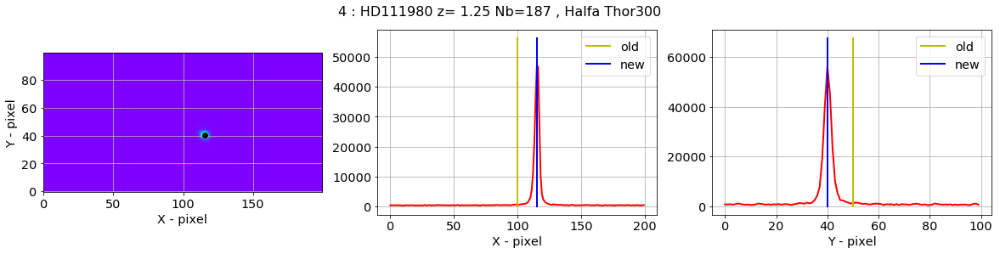

...

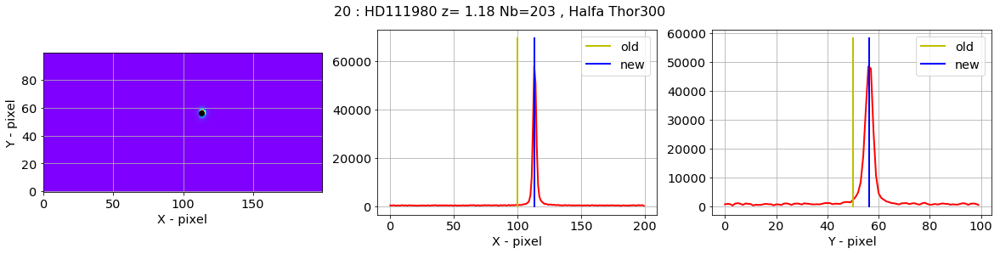

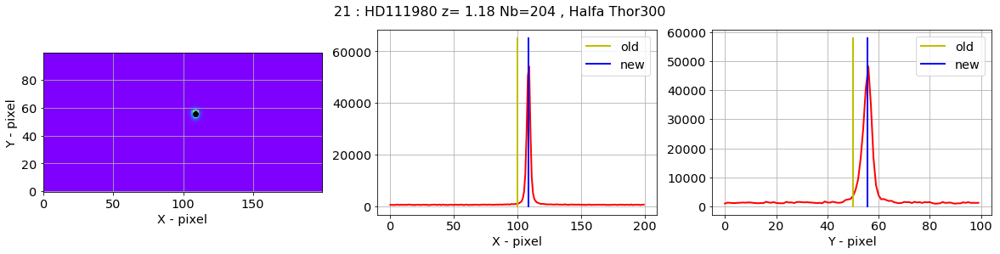

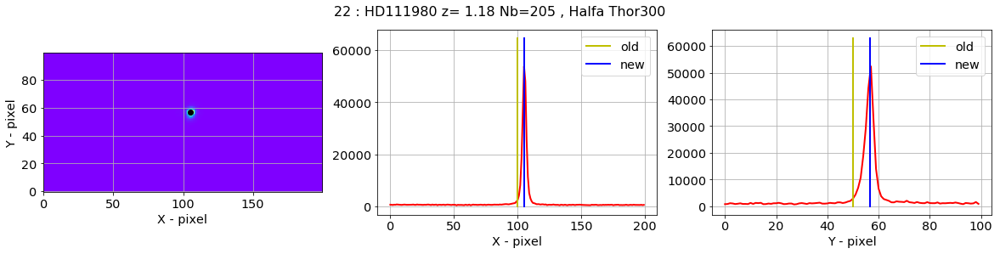

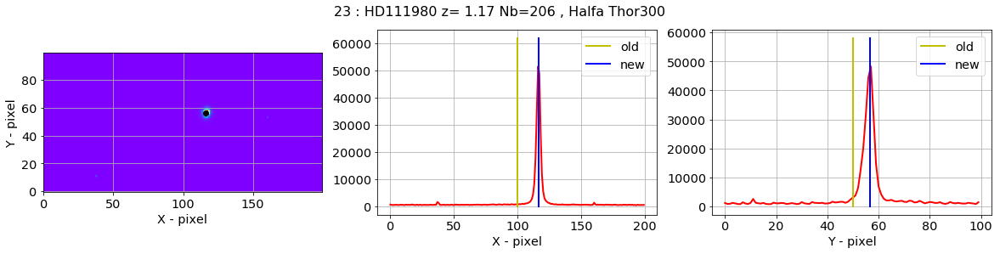

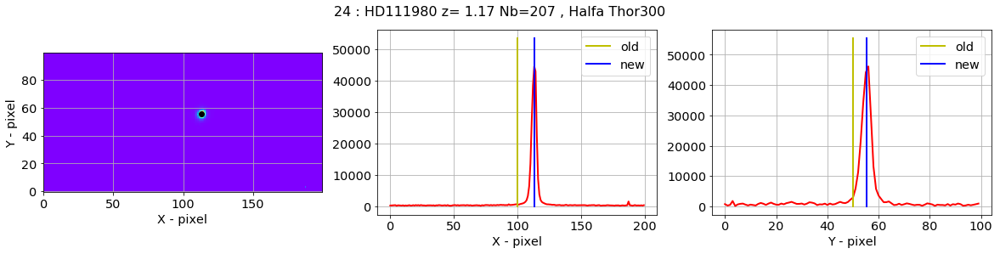

In [44]:
# (JN) valeurs optimisées pour cette étude
#img_mean,img_median,img_std,img_sources=ComputeStatImages(images_raw_cut,fwhm=5,threshold=200,sigma=10.0,iters=5)
xstar, ystar = check_central_star(images_raw_cut,DeltaX_rot,DeltaY_rot,all_titles,all_filt)


[[  409.84652757   330.26447183]
 [  745.78448366   330.39646221]
 [ 1082.64180616   329.56363325]
 [ 1417.26709738   330.43435989]
 [ 1756.34658529   330.11634863]
 [  411.35783192   663.83643704]
 [  747.00716748   662.77584181]
 [ 1097.43630477   662.02674734]
 [ 1420.09232988   661.52943225]
 [ 1756.53016737   662.41645424]
 [  411.61047538   995.84517738]
 [  748.48681354   995.35761905]
 [ 1084.89164066   995.08694438]
 [ 1419.58756544   994.82242698]
 [ 1755.29931836   994.61761198]
 [  411.78430123  1332.92408989]
 [  747.48126405  1331.66752878]
 [ 1099.59284167  1330.422879  ]
 [ 1420.82324438  1330.73276037]
 [ 1756.50978019  1330.7274184 ]
 [  411.3164463   1666.37835054]
 [  748.56857712  1665.7679509 ]
 [ 1081.26066294  1666.66424773]
 [ 1419.34442232  1666.53866038]
 [ 1754.05597636  1665.40785886]]
[758.44870990349364, 1436.3338292782594, 2109.1772553709361, 2771.2955130485311, 3447.833934736791, 759.85397039205282, 1437.4983246252846, 2124.4167177402592, 2773.537388062

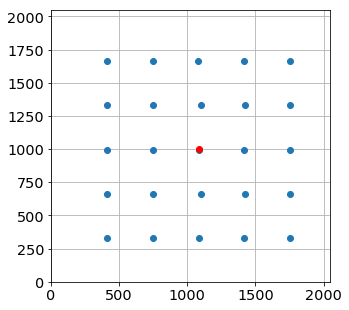

In [45]:
x_pointing = []
y_pointing = []
for index in range(len(xstar)):
    x_pointing.append(xstar[index]+x_guess[index]-DeltaX_rot[index])
    y_pointing.append(ystar[index]+y_guess[index]-DeltaY_rot[index])
        
x_mean = np.mean(x_pointing)
y_mean = np.mean(y_pointing)
img_size=all_images[0].shape
order0_positions = np.array([x_pointing,y_pointing]).T
print order0_positions
print x_star
plt.figure(figsize=(5,5))
plt.plot(order0_positions.T[0],order0_positions.T[1],'o')
plt.plot(x_mean,y_mean,'ro')
plt.xlim(0,IMSIZE)
plt.ylim(0,IMSIZE)
plt.grid(True)

## Save results

In [77]:
newfullfilenames=[]
for idx,f in np.ndenumerate(sorted_files):
    short_infilename=f.split("/")[-1]
    short_partfilename=re.findall('^cutimg_(.*)',short_infilename)
    short_outfilename='rotimg_'+short_partfilename[0]
    newfullfilename=os.path.join(outputdir,short_outfilename)
    newfullfilenames.append(newfullfilename)

In [78]:
for idx,f in np.ndenumerate(newfullfilenames):
    prihdu = fits.PrimaryHDU(header=all_header[idx[0]],data=images_cut_rot[idx[0]])
    thdulist = fits.HDUList(prihdu)
    thdulist.writeto(f,overwrite=True)
textfilename=os.path.join(outputdir,'star_centroids.txt')
print textfilename
np.savetxt(textfilename,order0_positions,header="y_star x_star",fmt='%d')

!ls -l rotated_fitsimages

./rotated_fitsimages/star_centroids.txt
total 80616
-rw-r--r--  1 jneveu  staff  1650240  4 avr 13:45 rotimg_20170609_183.fits
-rw-r--r--  1 jneveu  staff  1650240  4 avr 13:45 rotimg_20170609_184.fits
-rw-r--r--  1 jneveu  staff  1650240  4 avr 13:45 rotimg_20170609_185.fits
-rw-r--r--  1 jneveu  staff  1650240  4 avr 13:45 rotimg_20170609_186.fits
-rw-r--r--  1 jneveu  staff  1650240  4 avr 13:45 rotimg_20170609_187.fits
-rw-r--r--  1 jneveu  staff  1650240  4 avr 13:45 rotimg_20170609_188.fits
-rw-r--r--  1 jneveu  staff  1650240  4 avr 13:45 rotimg_20170609_189.fits
-rw-r--r--  1 jneveu  staff  1650240  4 avr 13:45 rotimg_20170609_190.fits
-rw-r--r--  1 jneveu  staff  1650240  4 avr 13:45 rotimg_20170609_191.fits
-rw-r--r--  1 jneveu  staff  1650240  4 avr 13:45 rotimg_20170609_192.fits
-rw-r--r--  1 jneveu  staff  1650240  4 avr 13:45 rotimg_20170609_193.fits
-rw-r--r--  1 jneveu  staff  1650240  4 avr 13:45 rotimg_20170609_194.fits
-rw-r--r--  1 jneveu  staff  1650240  4 avr 13:4

# Extract spectra
===================================

In [79]:
outputdir="./spectrum_fitsspec"
ensure_dir(outputdir)

inputdir="./rotated_fitsimages"
SelectTagRe='^rotimg_%s_([0-9]+).fits$' % date # regular expression to select the file
SearchTagRe='^rotimg_%s_[0-9]+.fits$' % date

In [80]:
sorted_numbers,sorted_files = MakeFileList([inputdir],MIN_IMGNUMBER,MAX_IMGNUMBER,SelectTagRe,SearchTagRe) 

all_dates,all_airmass,all_images,all_titles,all_header,all_expo,all_filt,all_filt1,all_filt2=BuildImages(sorted_files,sorted_numbers,object_name)

print 'Number of images:',len(all_images)

Number of images: 25


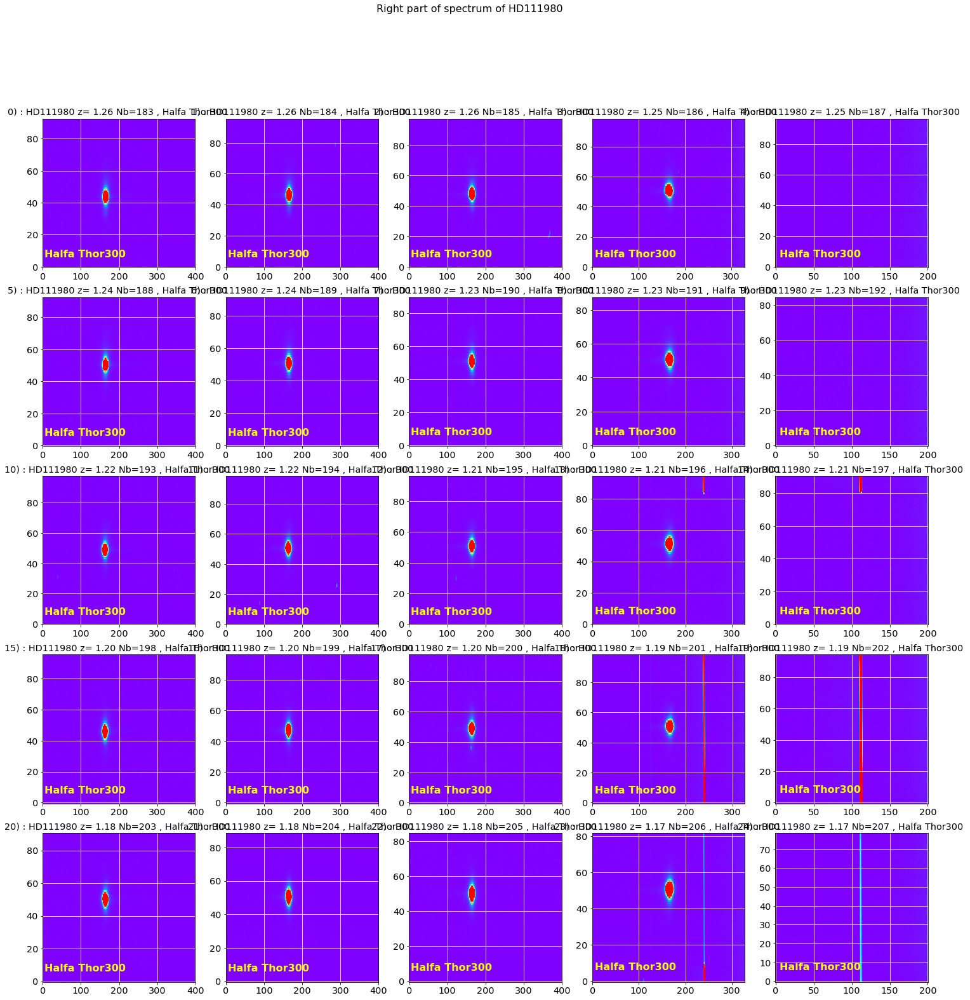

In [81]:
# Right spectrum
x_guess_right = []
for x in x_star :
    x_guess_right.append(min(IMSIZE-1,x+500))
ShowCenterImages(x_guess_right,y_star,[200]*len(all_images),[50]*len(all_images),
                 all_images,all_titles,all_filt,object_name,NBIMGPERROW=5,vmin=0,vmax=2000)
title='Right part of spectrum of {} '.format(object_name)
plt.suptitle(title,size=16)
figfilename=os.path.join(dir_top_images,'rightorder.pdf')
plt.savefig(figfilename)  

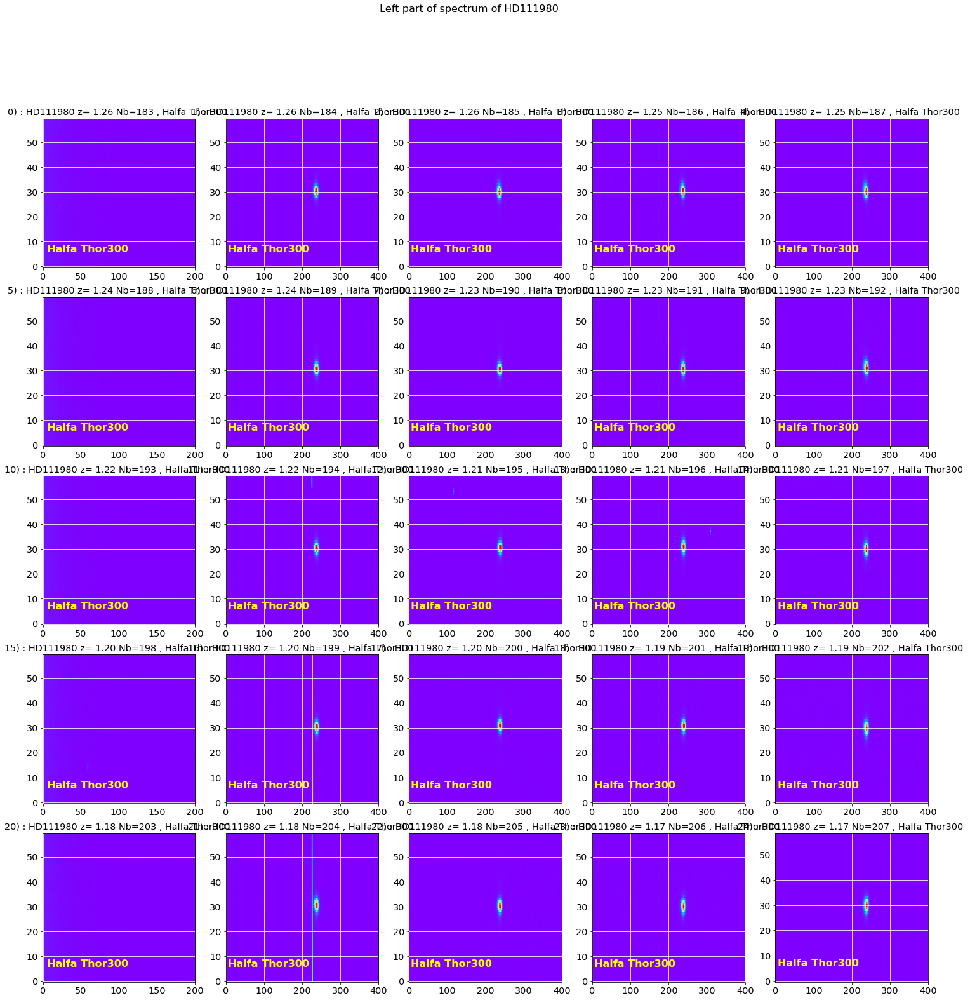

In [82]:
# Left spectrum
x_guess_left = []
for x in x_star :
    x_guess_left.append(max(1,x-500))
ShowCenterImages(x_guess_left,y_star,[200]*len(all_images),[30]*len(all_images),
                 all_images,all_titles,all_filt,object_name,NBIMGPERROW=5,vmin=0,vmax=2000)
title='Left part of spectrum of {} '.format(object_name)
plt.suptitle(title,size=16)
figfilename=os.path.join(dir_top_images,'leftorder.pdf')
plt.savefig(figfilename)  

### Extraction

[43,
 46,
 48,
 51,
 53,
 57,
 59,
 60,
 63,
 66,
 49,
 51,
 53,
 56,
 59,
 46,
 47,
 49,
 52,
 55,
 59,
 62,
 65,
 68,
 72]

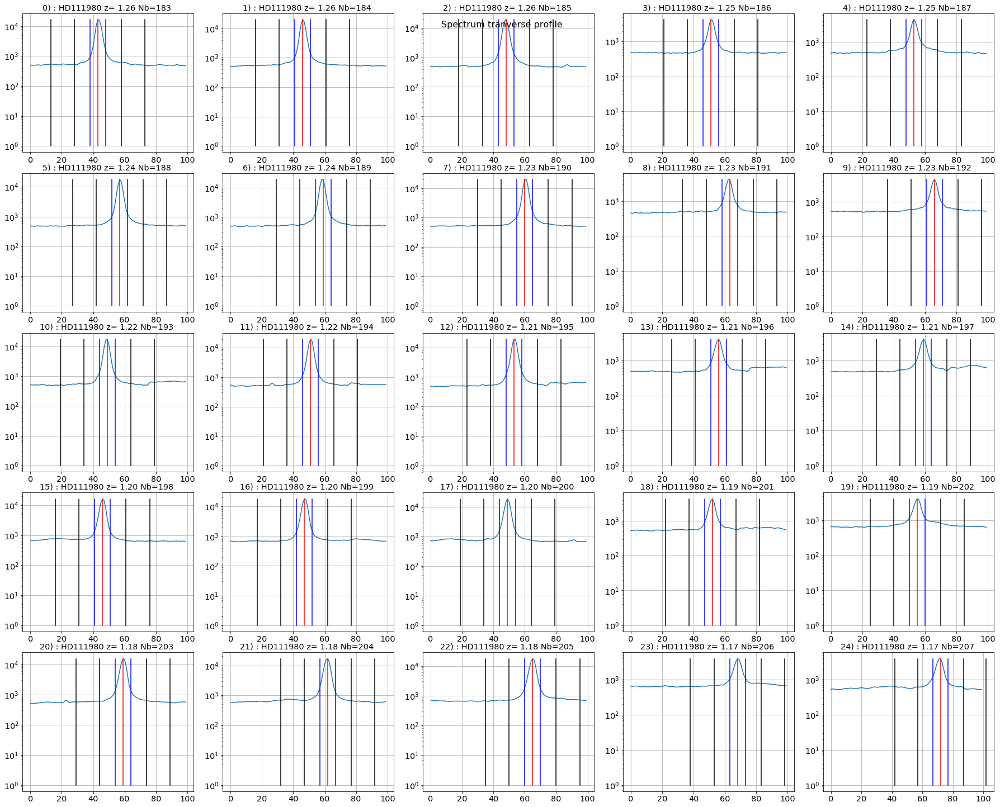

In [83]:
ShowTransverseProfile(all_images,all_titles,object_name,all_expo,NBIMGPERROW=5,DeltaX=1000,w=5,ws=[15,30],right_edge=1800)

In [84]:
thespectra,thespectraUp,thespectraDown=ExtractSpectra(y_star,all_images,all_titles,object_name,all_expo,
                                                      w=5,ws=[10,30],right_edge=IMSIZE)

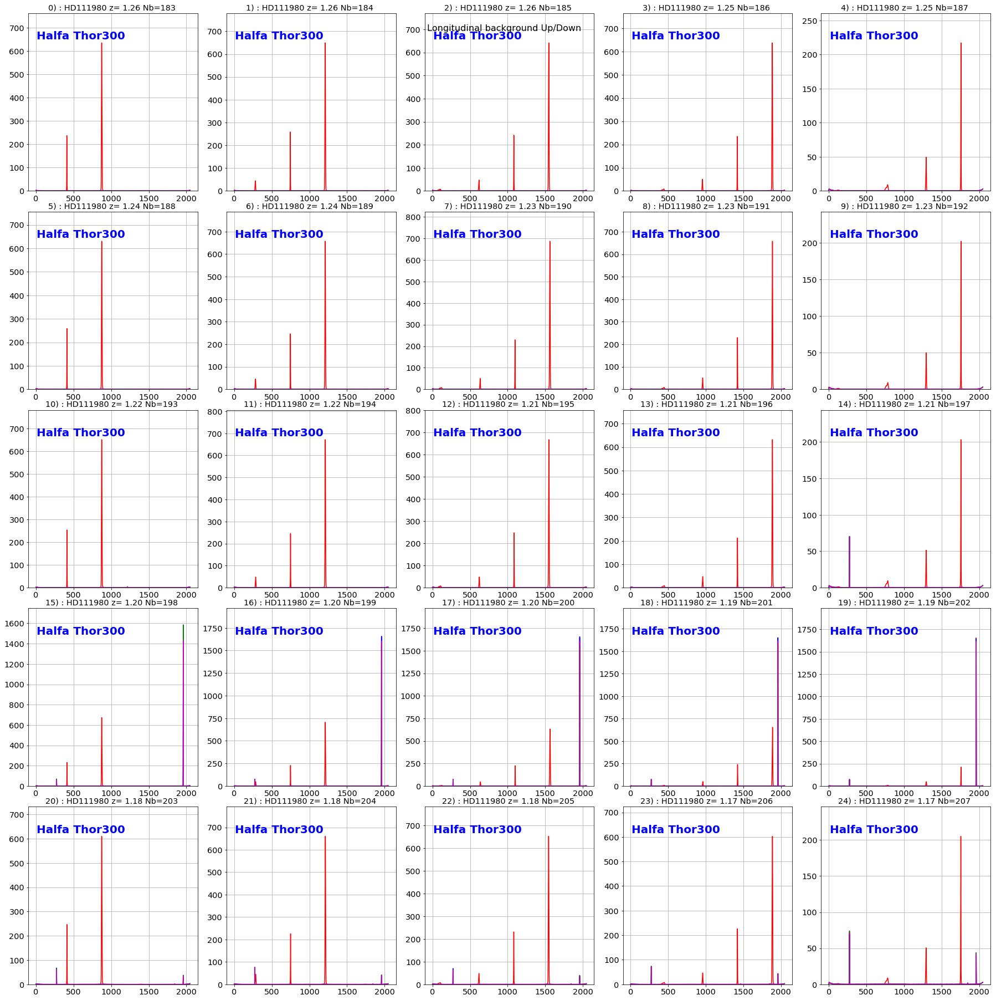

In [85]:
Clean_Up, Clean_Do,Clean_Av=CleanBadPixels(thespectraUp,thespectraDown) 

ShowLongitBackground(thespectra,Clean_Up,Clean_Do,Clean_Av,all_titles,all_filt,object_name,
                     NBIMGPERROW=5,right_edge=IMSIZE)
figfilename=os.path.join(dir_top_images,'background_longprofile.pdf')
plt.savefig(figfilename)   

(0, 800.0)

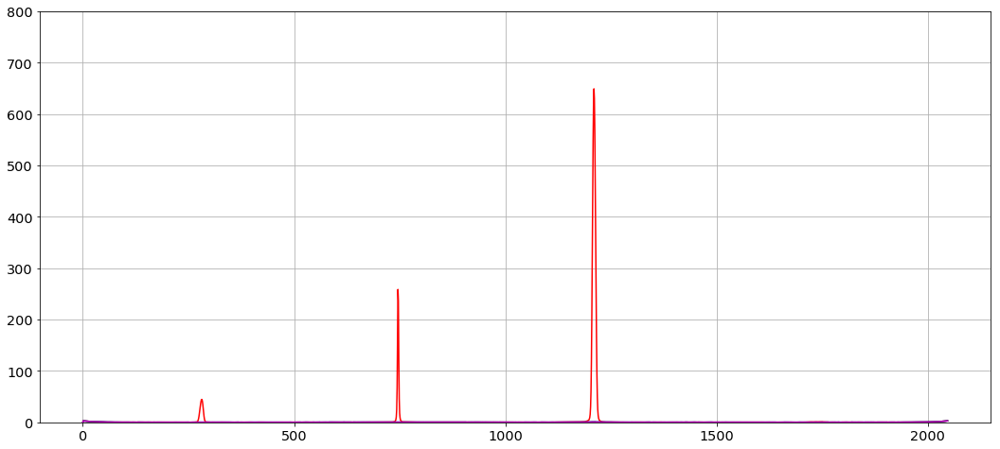

In [86]:
sel=1
plt.figure(figsize=(18,8))
plt.plot(thespectra[sel],'r-') 
plt.plot(Clean_Up[sel],'b-') 
plt.plot(Clean_Do[sel],'g-')
plt.plot(Clean_Av[sel],'m-')
plt.grid(True)
plt.ylim(0,800.)

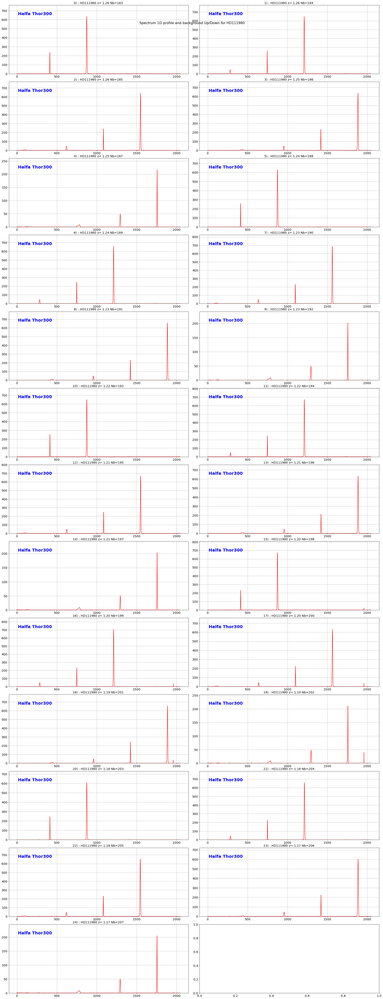

In [87]:
thecorrspectra=CorrectSpectrumFromBackground(thespectra,Clean_Av)

ShowSpectrumProfile(thecorrspectra,all_titles,object_name,all_filt,NBIMGPERROW=2)
figfilename=os.path.join(dir_top_images,'correctedspectrum_profile.pdf')
plt.savefig(figfilename) 

# Grating characterisation

Halfa Thor300:	 gaussian center x=410.47+/-0.02
Halfa Thor300:	 gaussian center x=746.33+/-0.02
Halfa Thor300:	 gaussian center x=1083.15+/-0.02
Halfa Thor300:	 gaussian center x=1418.27+/-0.02
Halfa Thor300:	 gaussian center x=1756.77+/-0.03
Halfa Thor300:	 gaussian center x=411.86+/-0.02
Halfa Thor300:	 gaussian center x=747.51+/-0.02
Halfa Thor300:	 gaussian center x=1098.41+/-0.02
Halfa Thor300:	 gaussian center x=1420.51+/-0.02
Halfa Thor300:	 gaussian center x=1756.94+/-0.02
Halfa Thor300:	 gaussian center x=412.16+/-0.02
Halfa Thor300:	 gaussian center x=749.02+/-0.02
Halfa Thor300:	 gaussian center x=1085.91+/-0.02
Halfa Thor300:	 gaussian center x=1420.55+/-0.02
Halfa Thor300:	 gaussian center x=1756.23+/-0.02
Halfa Thor300:	 gaussian center x=412.36+/-0.02
Halfa Thor300:	 gaussian center x=748.53+/-0.02
Halfa Thor300:	 gaussian center x=1100.59+/-0.02
Halfa Thor300:	 gaussian center x=1421.82+/-0.02
Halfa Thor300:	 gaussian center x=1757.48+/-0.03
Halfa Thor300:	 gaussian cen

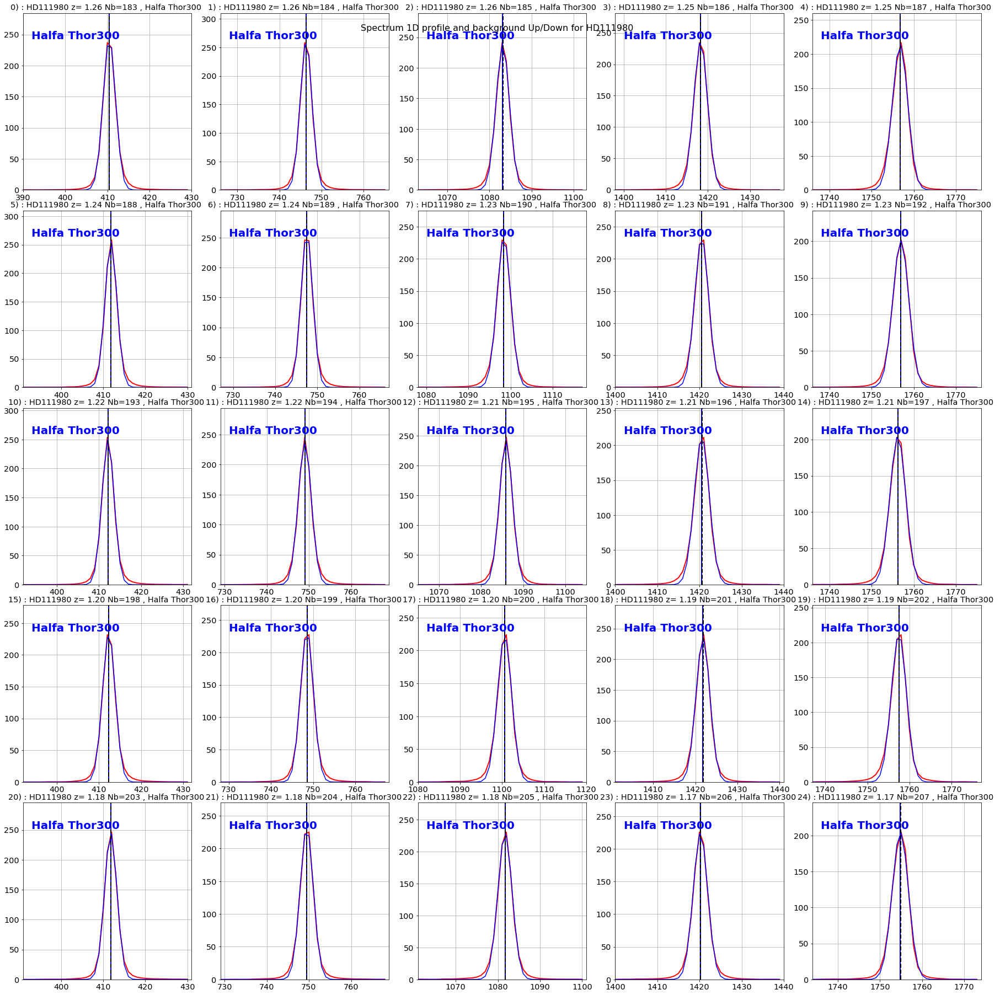

In [88]:
# Zero order profile
xlims_zero = []
for x in x_star :
    xlims_zero.append([x-20,x+20])
ShowSpectrumProfileFit(thecorrspectra,all_titles,object_name,all_filt,NBIMGPERROW=5,
                       xlim=xlims_zero,guess=[10,800,100],vertical_lines=x_star)
print 'CCDPROC star centers:'
print x_star

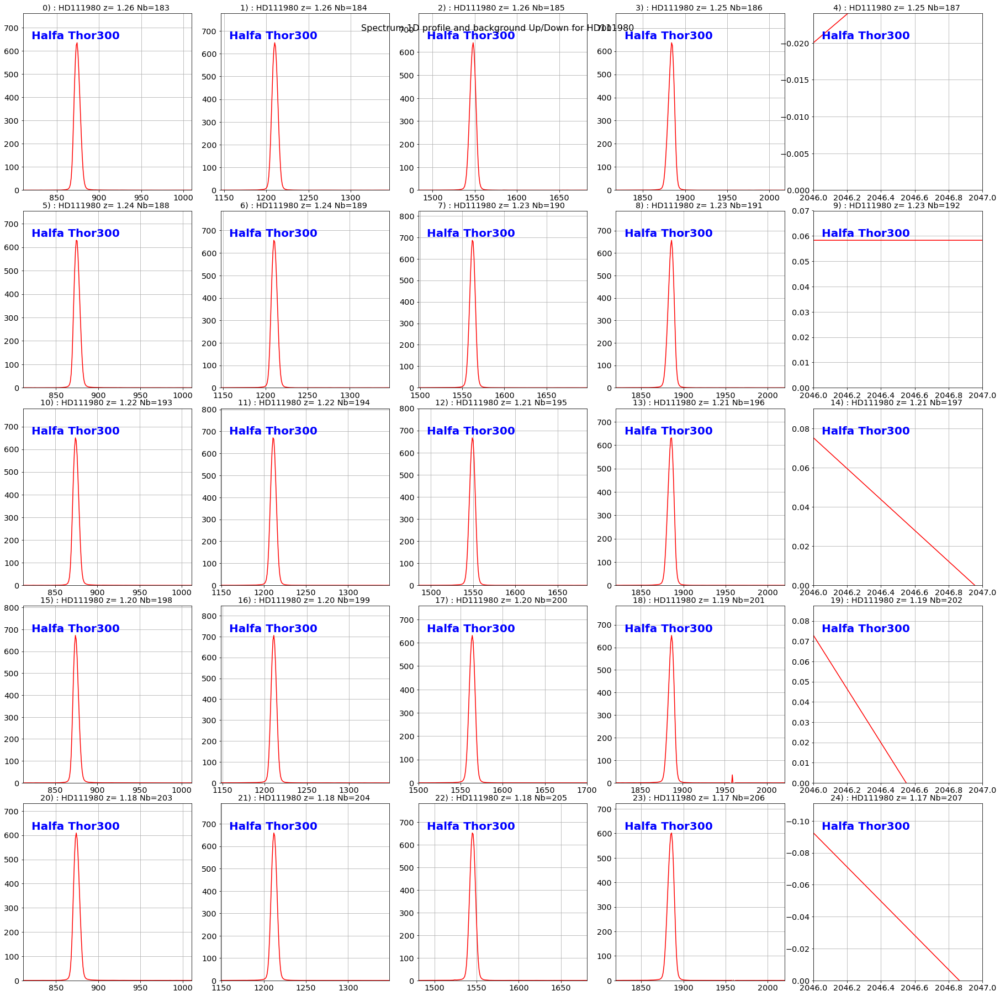

In [89]:
# Right spectrum profile
right_edge = thecorrspectra[0].shape[0]
xlims_right = []
for x in x_guess_right :
    if x == right_edge-1 :
        xlims_right.append([IMSIZE-2,IMSIZE-1])
    else :
        xlims_right.append([max(1,min(right_edge-2,int(x-100))),min(right_edge-1,int(x+100))])
ShowSpectrumProfile(thecorrspectra,all_titles,object_name,all_filt,NBIMGPERROW=5,xlim=xlims_right)

Halfa Thor300:	 gaussian center x=873.98+/-0.02
Halfa Thor300:	 gaussian center x=1210.20+/-0.01
Halfa Thor300:	 gaussian center x=1547.71+/-0.01
Halfa Thor300:	 gaussian center x=1883.83+/-0.02
Halfa Thor300:	 gaussian center x=874.66+/-0.02
Halfa Thor300:	 gaussian center x=1210.50+/-0.01
Halfa Thor300:	 gaussian center x=1562.24+/-0.01
Halfa Thor300:	 gaussian center x=1885.54+/-0.02
Halfa Thor300:	 gaussian center x=874.44+/-0.01
Halfa Thor300:	 gaussian center x=1211.40+/-0.00
Halfa Thor300:	 gaussian center x=1549.11+/-0.01
Halfa Thor300:	 gaussian center x=1885.20+/-0.02
Halfa Thor300:	 gaussian center x=874.42+/-0.02
Halfa Thor300:	 gaussian center x=1210.89+/-0.00
Halfa Thor300:	 gaussian center x=1563.82+/-0.01
Halfa Thor300:	 gaussian center x=1886.65+/-0.02
Halfa Thor300:	 gaussian center x=874.27+/-0.01
Halfa Thor300:	 gaussian center x=1212.28+/-0.01
Halfa Thor300:	 gaussian center x=1545.36+/-0.01
Halfa Thor300:	 gaussian center x=1885.28+/-0.02


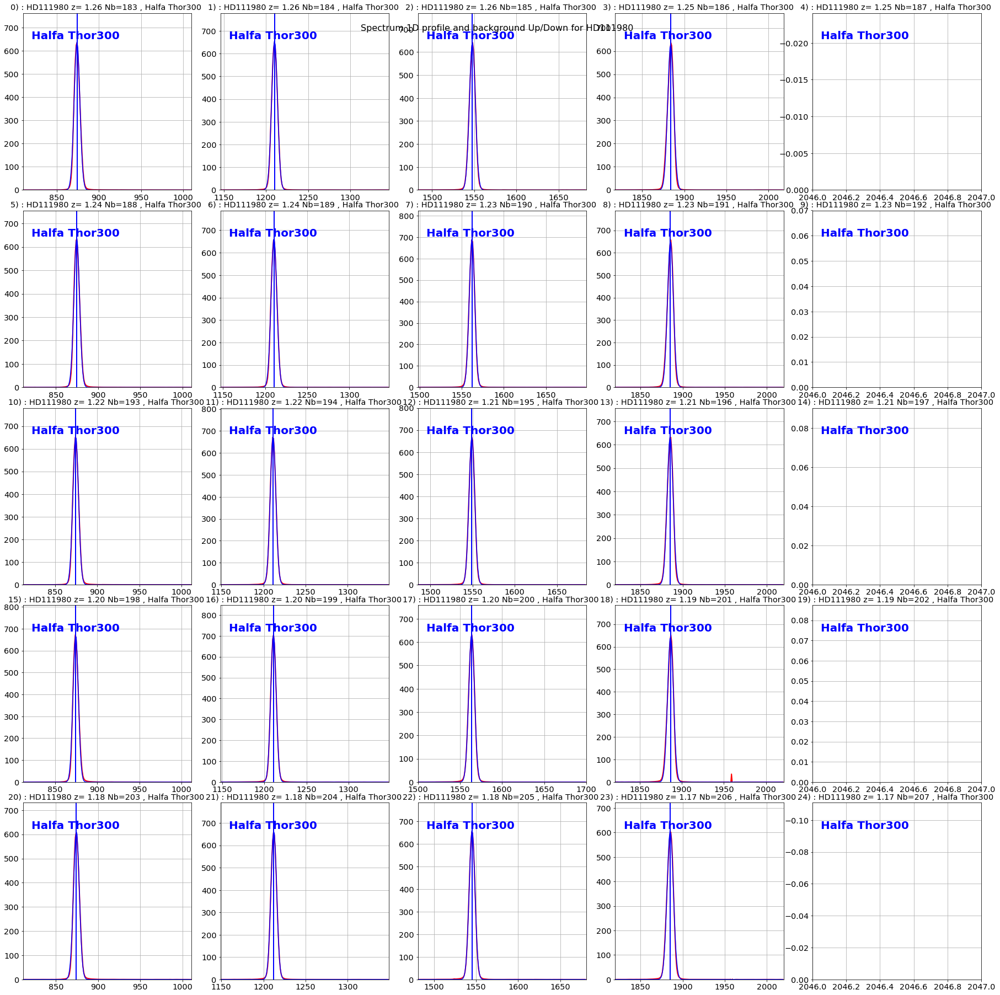

In [90]:
ShowSpectrumProfileFit(thecorrspectra,all_titles,object_name,all_filt,NBIMGPERROW=5,
                            xlim=xlims_right,guess=[10,1320,50])
figfilename=os.path.join(dir_top_images,'correctedspectrum_rightprofile2.pdf')
plt.savefig(figfilename)  

Halfa Thor300:	 gaussian center x=281.13+/-0.02
Halfa Thor300:	 gaussian center x=618.87+/-0.02
Halfa Thor300:	 gaussian center x=954.65+/-0.03
Halfa Thor300:	 gaussian center x=1293.49+/-0.04
Halfa Thor300:	 gaussian center x=282.94+/-0.01
Halfa Thor300:	 gaussian center x=634.96+/-0.02
Halfa Thor300:	 gaussian center x=957.61+/-0.03
Halfa Thor300:	 gaussian center x=1294.37+/-0.04
Halfa Thor300:	 gaussian center x=285.01+/-0.01
Halfa Thor300:	 gaussian center x=623.10+/-0.02
Halfa Thor300:	 gaussian center x=958.15+/-0.02
Halfa Thor300:	 gaussian center x=1294.00+/-0.03
Halfa Thor300:	 gaussian center x=284.52+/-0.04
Halfa Thor300:	 gaussian center x=637.71+/-0.02
Halfa Thor300:	 gaussian center x=959.63+/-0.03
Halfa Thor300:	 gaussian center x=1295.35+/-0.03
Halfa Thor300:	 gaussian center x=285.15+/-0.04
Halfa Thor300:	 gaussian center x=618.33+/-0.02
Halfa Thor300:	 gaussian center x=957.61+/-0.02
Halfa Thor300:	 gaussian center x=1292.50+/-0.04


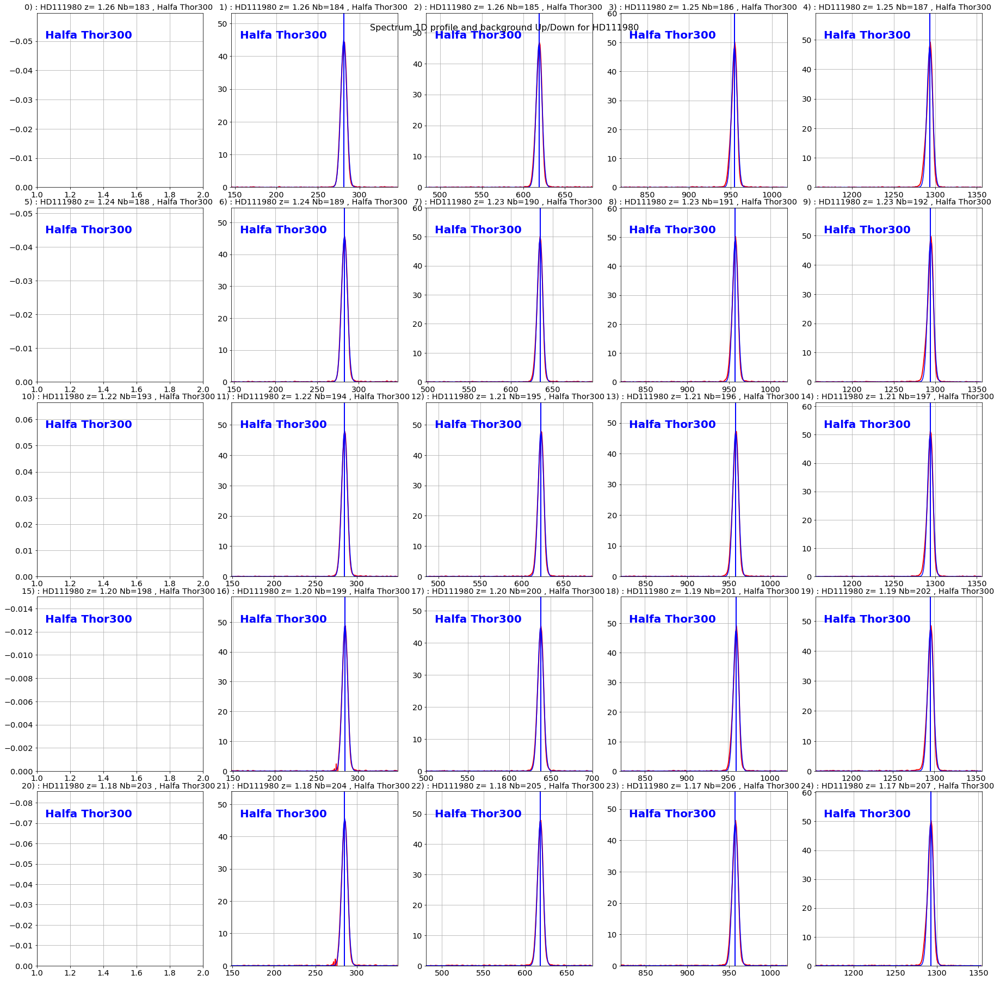

In [91]:
# Left profile
right_edge = thecorrspectra[0].shape[0]
xlims_left = []
for x in x_guess_left :
    if x == 1 :
        xlims_left.append([1,2])
    else :
        xlims_left.append([max(1,min(right_edge-2,int(x-100))),min(right_edge-1,int(x+100))])
ShowSpectrumProfileFit(thecorrspectra,all_titles,object_name,all_filt,NBIMGPERROW=5,
                            xlim=xlims_left,guess=[1,200,50])
figfilename=os.path.join(dir_top_images,'correctedspectrum_leftprofile2.pdf')
plt.savefig(figfilename)  

Present distance to CCD : 55.45 mm (to update if necessary)
-------------------------------
Halfa Thor300
Position of the H-alpha emission line : 463.53 +/- 0.02 pixels (0.00 percent) std: 3.42 pixels
-0.00119397752299 -2.7585868796 463.532653741 460.774066861 0.196850616087
Deduced distance to CCD with Halfa Thor300 : 55.46 +/- 0.19 mm (0.35 percent)
-------------------------------
Halfa Thor300
Position of the H-alpha emission line : 463.86 +/- 0.01 pixels (0.00 percent) std: 3.47 pixels
-0.000540879581359 -1.24965732129 463.864445078 462.614787757 0.197616728293
Deduced distance to CCD with Halfa Thor300 : 55.48 +/- 0.19 mm (0.35 percent)
-------------------------------
Halfa Thor300
Position of the H-alpha emission line : 464.53 +/- 0.01 pixels (0.00 percent) std: 3.54 pixels
0.000114005703147 0.263400677788 464.53398719 464.797387868 0.198524826855
Deduced distance to CCD with Halfa Thor300 : 55.54 +/- 0.19 mm (0.35 percent)
-------------------------------
Halfa Thor300
Position o

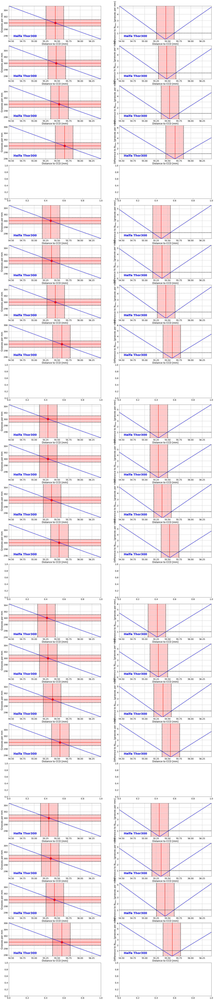

Present distance to CCD : 55.45 mm (to update if necessary)
-------------------------------
Halfa Thor300
Position of the H-alpha emission line : -465.21 +/- 0.02 pixels (-0.00 percent) std: 3.64 pixels
-0.000540879581359 -1.24965732129 -465.206854356 -466.456511678 -0.199214904619
Deduced distance to CCD with Halfa Thor300 : 55.62 +/- 0.19 mm (0.35 percent)
-------------------------------
Halfa Thor300
Position of the H-alpha emission line : -464.30 +/- 0.02 pixels (-0.01 percent) std: 3.50 pixels
0.000114005703147 0.263400677788 -464.304508688 -464.04110801 -0.198210204477
Deduced distance to CCD with Halfa Thor300 : 55.52 +/- 0.19 mm (0.35 percent)
-------------------------------
Halfa Thor300
Position of the H-alpha emission line : -463.65 +/- 0.03 pixels (-0.01 percent) std: 3.36 pixels
0.000764551689261 1.76643330958 -463.649495217 -461.883061907 -0.19731221043
Deduced distance to CCD with Halfa Thor300 : 55.46 +/- 0.19 mm (0.35 percent)
-------------------------------
Halfa Thor

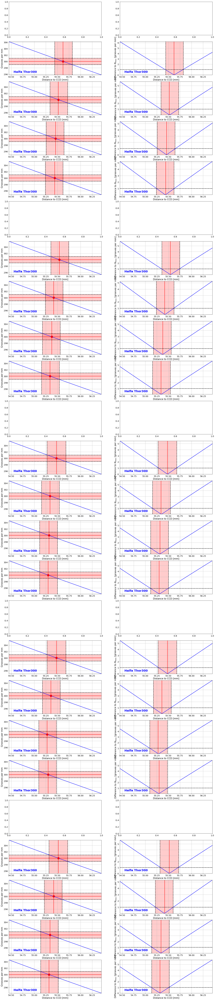

-------------------------------
Average distance to CCD : 55.42 +/- 0.19 mm (0.35 percent)


In [145]:
guess = [1,1320,50]
distance_rightorder, distance_rightorder_err, distances_rightorder = CalibrateDistance2CCD_OneOrder(thecorrspectra,
                            x_star,order0_positions,all_filt,xlims_right,guess,order=1)

guess=[10,200,100]
distance_leftorder, distance_leftorder_err, distances_leftorder = CalibrateDistance2CCD_OneOrder(thecorrspectra,
                            x_star,order0_positions,all_filt,xlims_left,guess,order=-1)

print '-------------------------------'  
distance_mean = np.mean([distance_rightorder,distance_leftorder])
distance_mean_err = np.sqrt(np.mean(np.array([distance_rightorder_err,distance_leftorder_err])**2))
print 'Average distance to CCD : %.2f +/- %.2f mm (%.2f percent)' % (distance_mean,distance_mean_err,100*distance_mean_err/distance_mean)

The DISTANCE2CCD value shifts in opposite way accross the images if we use the right or left order spectra. It meens that the uncertainty comes from the position of the star center along the x axis. The determinantion with both orders can remove this effect.

Present distance to CCD : 55.45 mm (to update if necessary)
-------------------------------
Halfa Thor300
Position of the H-alpha emission line : 464.54 +/- 0.01 pixels (0.00 percent)
Deduced distance to CCD with Halfa Thor300 : 55.56 +/- 0.19 mm (0.35 percent)
-------------------------------
Halfa Thor300
Position of the H-alpha emission line : 464.42 +/- 0.01 pixels (0.00 percent)
Deduced distance to CCD with Halfa Thor300 : 55.54 +/- 0.19 mm (0.35 percent)
-------------------------------
Halfa Thor300
Position of the H-alpha emission line : 464.59 +/- 0.02 pixels (0.00 percent)
Deduced distance to CCD with Halfa Thor300 : 55.56 +/- 0.19 mm (0.35 percent)
-------------------------------
Halfa Thor300
Position of the H-alpha emission line : 463.78 +/- 0.01 pixels (0.00 percent)
Deduced distance to CCD with Halfa Thor300 : 55.46 +/- 0.19 mm (0.35 percent)
-------------------------------
Halfa Thor300
Position of the H-alpha emission line : 463.64 +/- 0.01 pixels (0.00 percent)
Deduced 

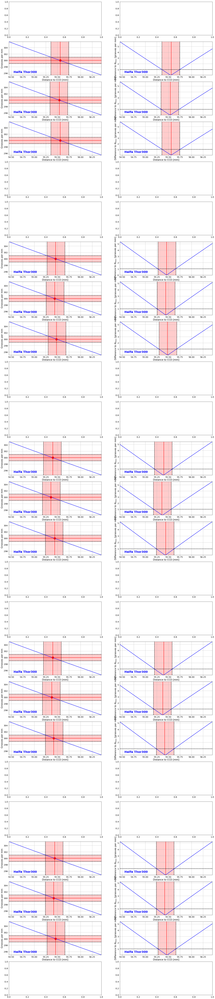

In [151]:
distance_mean, distance_mean_err, distances = CalibrateDistance2CCD_TwoOrder(thecorrspectra,order0_positions,all_filt,leftorder_edges=xlims_left,rightorder_edges=xlims_right,guess=[[10,200,200],[1,1320,50]],bounds=(-np.inf,np.inf))

### Conclusion on DISTANCE2CCD

The Thor300 gratings was mounted on the same plastic frame as the holograms, thus the DISTANCE2CCD is expected to closer to the reality for those. The Ron400 H-ampha peaks are unforcused. The Thor300 +1 and -1 orders are well focused then we use the Thor300 TwoOrder method to fix DISTANCE2CCD.

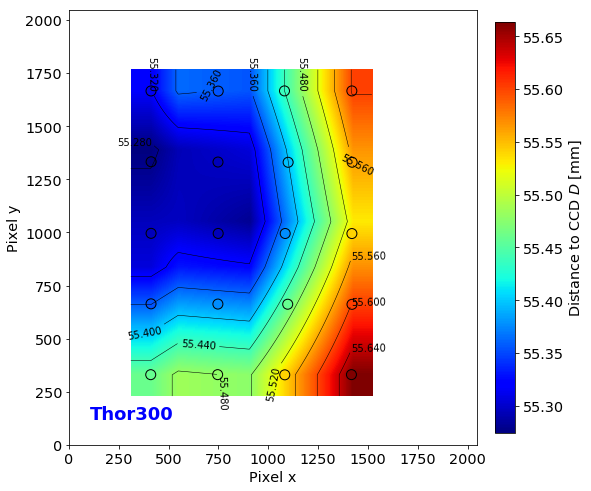

In [115]:
margin = 100

y = []
x = []
d = []
for k in range(len(distances_rightorder)):
    if np.isnan(distances_rightorder[k]) : continue
    y.append((order0_positions.T)[1][k])
    x.append((order0_positions.T)[0][k])
    d.append(distances_rightorder[k])
xx,yy,z,interp = scatter_interpol(np.array([x,y]).T,d,margin=margin,kind='linear')

fig = plt.figure(figsize=(8,8))
plt.scatter(x, y, c=d, s=100, cmap=cm.jet, marker='o', vmin=np.min(d), vmax=np.max(d),edgecolors='k')
im = plt.imshow(z, extent=[np.min(x)-margin, np.max(x)+margin, np.min(y)-margin, np.max(y)+margin],origin='lower',aspect='auto',cmap=cm.jet)
plt.xlabel('Pixel x')
plt.ylabel('Pixel y')
plt.annotate(holo_name,xy=(0.05,0.05),xytext=(0.05,0.05),horizontalalignment='left',
             verticalalignment='bottom',fontweight='bold',color='blue',fontsize=18,xycoords='axes fraction')
plt.xlim([0,IMSIZE])
plt.ylim([0,IMSIZE])

#xx,yy,z,interp = scatter_interpol(np.array([y,x]).T,d,margin=margin)
CS = plt.contour(xx,yy,z,10,linewidths=0.5,colors='k')
plt.clabel(CS, inline=1, fontsize=10)

cb = fig.colorbar(im,fraction=0.046, pad=0.04)#, cax=cbar_ax)
#cb.formatter.set_powerlimits((0, 0))
cb.update_ticks()
cb.set_label('Distance to CCD $D$ [mm]') #,fontsize=16)

plt.show()

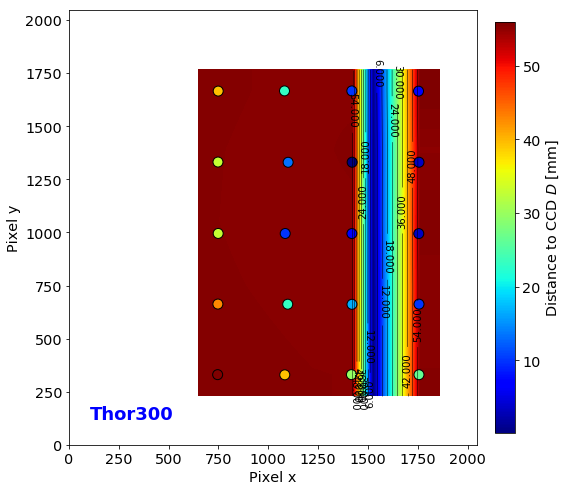

In [117]:
margin = 100

y = []
x = []
d = []
for k in range(len(distances_leftorder)):
    if np.isnan(distances_leftorder[k]) : continue
    y.append((order0_positions.T)[1][k])
    x.append((order0_positions.T)[0][k])
    d.append(distances_leftorder[k])
xx,yy,z,interp = scatter_interpol(np.array([x,y]).T,d,margin=margin,kind='linear')

fig = plt.figure(figsize=(8,8))
plt.scatter(x, y, c=d, s=100, cmap=cm.jet, marker='o', vmin=np.min(d), vmax=np.max(d),edgecolors='k')
im = plt.imshow(z, extent=[np.min(x)-margin, np.max(x)+margin, np.min(y)-margin, np.max(y)+margin],origin='lower',aspect='auto',cmap=cm.jet)
plt.xlabel('Pixel x')
plt.ylabel('Pixel y')
plt.annotate(holo_name,xy=(0.05,0.05),xytext=(0.05,0.05),horizontalalignment='left',
             verticalalignment='bottom',fontweight='bold',color='blue',fontsize=18,xycoords='axes fraction')
plt.xlim([0,IMSIZE])
plt.ylim([0,IMSIZE])

#xx,yy,z,interp = scatter_interpol(np.array([y,x]).T,d,margin=margin)
CS = plt.contour(xx,yy,z,10,linewidths=0.5,colors='k')
plt.clabel(CS, inline=1, fontsize=10)

cb = fig.colorbar(im,fraction=0.046, pad=0.04)#, cax=cbar_ax)
#cb.formatter.set_powerlimits((0, 0))
cb.update_ticks()
cb.set_label('Distance to CCD $D$ [mm]') #,fontsize=16)

plt.show()

/Users/jneveu/anaconda2/lib/python2.7/site-packages/scipy/interpolate/_fitpack_impl.py:975: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=6,6 m=15 fp=0.000252 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))


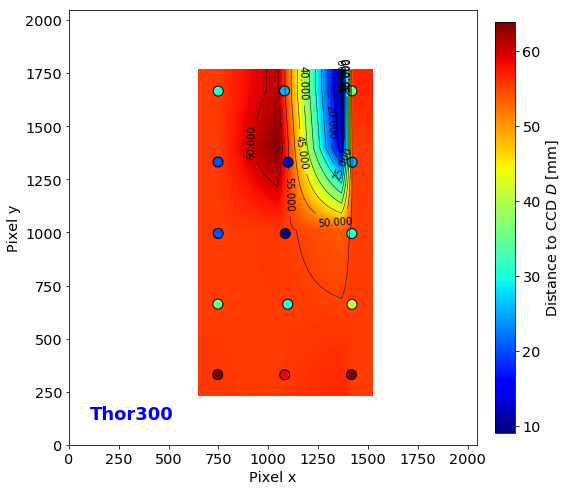

In [116]:
margin = 100

y = []
x = []
d = []
for k in range(len(distances)):
    if np.isnan(distances[k]) : continue
    y.append((order0_positions.T)[1][k])
    x.append((order0_positions.T)[0][k])
    d.append(distances[k])
xx,yy,z,interp = scatter_interpol(np.array([x,y]).T,d,margin=margin,kind='linear')

fig = plt.figure(figsize=(8,8))
plt.scatter(x, y, c=d, s=100, cmap=cm.jet, marker='o', vmin=np.min(d), vmax=np.max(d),edgecolors='k')
im = plt.imshow(z, extent=[np.min(x)-margin, np.max(x)+margin, np.min(y)-margin, np.max(y)+margin],origin='lower',aspect='auto',cmap=cm.jet)
plt.xlabel('Pixel x')
plt.ylabel('Pixel y')
plt.annotate(holo_name,xy=(0.05,0.05),xytext=(0.05,0.05),horizontalalignment='left',
             verticalalignment='bottom',fontweight='bold',color='blue',fontsize=18,xycoords='axes fraction')
plt.xlim([0,IMSIZE])
plt.ylim([0,IMSIZE])

#xx,yy,z,interp = scatter_interpol(np.array([y,x]).T,d,margin=margin)
CS = plt.contour(xx,yy,z,10,linewidths=0.5,colors='k')
plt.clabel(CS, inline=1, fontsize=10)

cb = fig.colorbar(im,fraction=0.046, pad=0.04)#, cax=cbar_ax)
#cb.formatter.set_powerlimits((0, 0))
cb.update_ticks()
cb.set_label('Distance to CCD $D$ [mm]') #,fontsize=16)

plt.show()

## Resolution of the holograms

With the +1 order

In [ ]:
guess = [1,1320,50]
N_rightorder, N_rightorder_err = GratingResolution_OneOrder(thecorrspectra,
                                        x_star,order0_positions,all_images,all_filt,xlims_right,guess,order=+1)

With the two orders

In [ ]:
Ns, N_errs = GratingResolution_TwoOrder(thecorrspectra,all_images,all_filt,
                        leftorder_edges=xlims_left,rightorder_edges=xlims_right,guess=[[10,200,100],[1,1320,50]])

In [ ]:
margin = 100

y = []
x = []
d = []
N = []
for k in range(len(distances)):
    if np.isnan(distances[k]) : continue
    y.append((order0_positions.T)[1][k])
    x.append((order0_positions.T)[0][k])
    d.append(distances[k])
    N.append(Ns[k])
xx,yy,z,interp = scatter_interpol(np.array([y,x]).T,d,margin=margin,kind='linear')

G= Grating(400,label=holo_name)
ronchi = build_ronchi(G.plate_center[0],G.plate_center[1],G.theta_tilt,grooves=0.4)

fig = plt.figure(figsize=(8,8))

plt.imshow(ronchi,origin='lower', alpha=0.5, cmap=cm.pink)

plt.scatter(x, y, c=d, s=100, cmap=cm.jet, marker='o', vmin=np.min(d), vmax=np.max(d),edgecolors='k',label='Pointings')
im = plt.imshow(z, extent=[np.min(x)-margin, np.max(x)+margin, np.min(y)-margin, np.max(y)+margin],origin='lower',aspect='auto',alpha=0.7,cmap=cm.jet)
plt.xlabel('Pixel x')
plt.ylabel('Pixel y')
plt.annotate(holo_name,xy=(0.05,0.05),xytext=(0.05,0.05),horizontalalignment='left',
             verticalalignment='bottom',fontweight='bold',color='blue',fontsize=18,xycoords='axes fraction')
plt.xlim([0,IMSIZE])
plt.ylim([0,IMSIZE])

xx,yy,z,interp = scatter_interpol(np.array([y,x]).T,N,margin=margin,kind='linear')
CS = plt.contour(xx,yy,z,10,linewidths=0.5,colors='k',label='Grooves per mm')
plt.clabel(CS, inline=1, fontsize=10)
labels = ['Grooves per mm with $D=%.4g$mm' % DISTANCE2CCD]
for i in range(len(labels)):
    CS.collections[i].set_label(labels[i])


cb = fig.colorbar(im,fraction=0.046, pad=0.04)#, cax=cbar_ax)
#cb.formatter.set_powerlimits((0, 0))
cb.update_ticks()
cb.set_label('Distance to CCD $D$ [mm]') #,fontsize=16)
plt.legend()
plt.show()

## Save grating resolution

In [ ]:
N = []
Nerr = []
for k in range(len(Ns)):
    if np.isnan(Ns[k]): continue
    N.append(Ns[k])
    Nerr.append(N_errs[k])
N_mean = np.mean(N)
N_mean_err = np.sqrt(np.mean(np.array(Nerr)**2))
print 'With distance to CCD = %.2f +/- %.2f mm' % (DISTANCE2CCD, DISTANCE2CCD_ERR)
print 'Average grooves per mm : %.2f +/- %.2f /mm (%.2f percent)' % (N_mean,N_mean_err,100*N_mean_err/N_mean)

dirname = "../../common_tools/data/"+holo_name
ensure_dir(dirname)
#print 'Save results in ',dirname
#np.savetxt(dirname+'/N.txt',[N_mean,N_mean_err])

## Save spectra

In [ ]:
newfullfilenames=[]
for idx,file in np.ndenumerate(sorted_files):
    short_infilename=file.split("/")[2]
    short_partfilename=re.findall('^rotimg_(.*)',short_infilename)
    short_outfilename='finalSpectra_'+short_partfilename[0]
    newfullfilename=os.path.join(outputdir,short_outfilename)
    newfullfilenames.append(newfullfilename)

for idx,file in np.ndenumerate(newfullfilenames):
    prihdu = fits.PrimaryHDU(header=all_header[idx[0]],data=thecorrspectra[idx[0]])
    thdulist = fits.HDUList(prihdu)
    thdulist.writeto(file,clobber=True)
    
!ls -l spectrum_fitsspec